<a href="https://colab.research.google.com/github/HyeonhoonLee/KIOM_KDC/blob/master/KDC_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#KIOM 한의임상정보은행 data 분석하기

일단 데이터를 추출해서 상관분석을 전부 돌려보자.

# 라이브러리 로드

In [23]:
# 분석에 사용할 pandas, 수치계산에 사용할 numpy, 시각화에 사용할 seaborn 을 불러옵니다.
# 또, 구 버전의 주피터 노트북에서는 %matplotlib inline 설정을 되어야 노트북 안에서 그래프를 시각화 합니다.

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

#한글 폰트 설정

In [24]:
# Google Colab 사용 시 아래 주석을 풀고 폰트설정을 합니다.
# 로컬 아나콘다 사용 시에는 그대로 주석처리 해놓으시면 됩니다.
# 나눔고딕 설치
# 이 코드를 사용시 아래에 있는 폰트를 로드할 경우 colab에서는 오류가 발생하니
# 아래에 있는 폰트 설정은 꼭 주석처리를 해주세요. 
!apt -qq -y install fonts-nanum > /dev/null

import matplotlib.font_manager as fm

fontpath = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
font = fm.FontProperties(fname=fontpath, size=9)

fm._rebuild()

# Colab 의 한글 폰트 설정
plt.rc('font', family='NanumGothic') 
# 마이너스 폰트 깨지는 문제에 대한 대처
plt.rc("axes", unicode_minus=False)

In [25]:
# 레티나 설정을 해주면 글씨가 좀 더 선명하게 보입니다.
# 폰트의 주변이 흐릿하게 보이는 것을 방지합니다.
%config InlineBackend.figure_format = 'retina'

#데이터 불러오기

- 데이터 로드 주소: https://www.data.go.kr/data/3072201/fileData.do
- 임상정보은행 사이트에서 상세이용방법 확인가능 (https://kdc.kiom.re.kr/html/?pmode=subpage&MMC_pid=200&spSeq=22)

In [26]:
# 다운로드 받은 파일을 판다스의 read_csv 를 통해 읽어옵니다.
# 파일을 읽어온 후 shape 로 행과 열의 수를 출력합니다.

##UTF-8이 아니면, encoding=에다가 cp949나 euc-kr을 넣어줘야한다.
df = pd.read_csv("/content/drive/My Drive/DataCollection/KIOM_KDC/data/한의임상정보은행 교육용 데이터 (2016.10.27)..csv", encoding="cp949")
df.shape

(500, 73)

In [27]:
# sample, head, tail을 통해 데이터를 미리보기 합니다.
df.sample(5)

,대상자식별코드,성별,만나이,직업분류,학력,결혼유무,음주력,흡연력,성격_대범_섬세,성격_행동빠름_행동느림,성격_적극_소극,성격_직접_간접,성격_포기빠름_포기느림,성격_외향_내성,성격_동적_정적,성격_쉽게_어렵게,성격_남성적_여성적,성격_참을성부족_잘찾음,성격_큰편_적은편,성격_잘드러냄_안드러냄,성격_잘표현_표현안하는편,성격_가끔흥분_이성적,성격_덜렁_꼼꼼,식사량,식사속도,소화여부,소화입맛,땀정도,땀기분,대변습관,대변굳기,배변시긴박감,배변후잔변감,소변야간뇨,한열민감도,한열손부위,한열발부위,한열배부위,음수정도,음수온다,한열점수,한열그룹,고혈압_진단,당뇨_진단,고지혈증_진단,일반건강,수면시간(시간),수면시간(분),피로정도,피로_기상시,피로_오전,피로_오후,피로_밤,피로_하루종일,한의사체질진단,키,몸무게,BMI,이마둘레,목둘레,겨드랑이둘레,가슴둘레,늑골둘레,허리둘레,장골둘레,곡골둘레,수축기혈합,이완기혈압,혈당,총콜레스테롤,중성지방,고밀도콜레스테롤,저밀도콜레스테롤
433,KDCT00434,2,60.877,14,1,2,999,999,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,999,1,1,1,1,2,1,2,3,3,2.0,2,3,3,3,3,2,10,2,2,1,2,4,5,0,4,1,1,0,0,0,1,151.0,66.0,28.9,54.2,37.0,105.5,107.3,101.0,105.7,106.1,106.5,130,80,102,207,167,42,140
115,KDCT00116,2,45.049,14,5,2,999,999,2,2,1,1,2,1,1,1,2,2,2,1,1,1,2,2,1,1,2,2,3,1,2,999,999,0.0,1,1,3,3,4,3,10,2,1,1,1,3,7,0,3,1,0,1,0,0,3,152.0,53.0,22.9,54.5,32.9,85.5,89.0,74.8,79.0,86.0,87.5,120,80,98,215,76,49,136
148,KDCT00149,2,49.173,14,5,2,999,999,2,1,1,3,3,3,1,1,3,3,1,3,2,3,3,2,1,1,3,3,1,2,1,999,999,2.0,1,3,3,2,3,1,7,1,2,1,1,3,4,0,3,1,1,0,0,0,1,167.0,67.0,24.0,56.3,32.8,89.0,92.5,77.0,87.8,92.0,95.5,130,80,88,138,90,39,74
92,KDCT00093,1,15.871,14,3,1,999,999,2,1,1,1,2,2,1,1,2,3,1,1,1,1,2,2,2,1,2,2,1,2,2,999,999,1.0,1,3,3,2,2,2,10,2,1,1,1,2,7,0,2,1,0,0,0,0,2,177.0,69.0,22.0,58.5,38.0,87.9,85.0,77.8,75.6,87.5,91.5,96,60,93,157,77,42,85
490,KDCT00491,1,58.441,7,4,2,1,1,3,1,2,1,1,3,3,2,1,3,2,3,3,3,3,3,999,1,3,2,3,1,3,3,2,0.0,1,2,2,3,2,2,11,2,1,1,1,3,8,0,2,0,1,0,0,0,2,162.5,56.9,21.5,56.5,35.5,67.0,86.8,76.0,72.5,83.0,85.2,117,84,87,196,358,68,79


#기본정보 보기

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 73 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   대상자식별코드        500 non-null    object 
 1   성별             500 non-null    int64  
 2   만나이            500 non-null    float64
 3   직업분류           500 non-null    int64  
 4   학력             500 non-null    int64  
 5   결혼유무           500 non-null    int64  
 6   음주력            500 non-null    int64  
 7   흡연력            500 non-null    int64  
 8   성격_대범_섬세       500 non-null    int64  
 9   성격_행동빠름_행동느림   500 non-null    int64  
 10  성격_적극_소극       500 non-null    int64  
 11  성격_직접_간접       500 non-null    int64  
 12  성격_포기빠름_포기느림   500 non-null    int64  
 13  성격_외향_내성       500 non-null    int64  
 14  성격_동적_정적       500 non-null    int64  
 15  성격_쉽게_어렵게      500 non-null    int64  
 16  성격_남성적_여성적     500 non-null    int64  
 17  성격_참을성부족_잘찾음   500 non-null    int64  
 18  성격_큰편_적은편 

In [29]:
# 컬럼들을 한번에 확인합니다.
df.columns

Index(['대상자식별코드', '성별', '만나이', '직업분류', '학력', '결혼유무', '음주력', '흡연력', '성격_대범_섬세',
       '성격_행동빠름_행동느림', '성격_적극_소극', '성격_직접_간접', '성격_포기빠름_포기느림', '성격_외향_내성',
       '성격_동적_정적', '성격_쉽게_어렵게', '성격_남성적_여성적', '성격_참을성부족_잘찾음', '성격_큰편_적은편',
       '성격_잘드러냄_안드러냄', '성격_잘표현_표현안하는편', '성격_가끔흥분_이성적', '성격_덜렁_꼼꼼', '식사량',
       '식사속도', '소화여부', '소화입맛', '땀정도', '땀기분', '대변습관', '대변굳기', '배변시긴박감',
       '배변후잔변감', '소변야간뇨', '한열민감도', '한열손부위', '한열발부위', '한열배부위', '음수정도', '음수온다',
       '한열점수', '한열그룹', '고혈압_진단', '당뇨_진단', '고지혈증_진단', '일반건강', '수면시간(시간)',
       '수면시간(분)', '피로정도', '피로_기상시', '피로_오전', '피로_오후', '피로_밤', '피로_하루종일',
       '한의사체질진단', '키', '몸무게', 'BMI', '이마둘레', '목둘레', '겨드랑이둘레', '가슴둘레', '늑골둘레',
       '허리둘레', '장골둘레', '곡골둘레', '수축기혈합', '이완기혈압', '혈당', '총콜레스테롤', '중성지방',
       '고밀도콜레스테롤', '저밀도콜레스테롤'],
      dtype='object')

In [30]:
# dtypes 를 통해 데이터 형식만 출력합니다.
df.dtypes

대상자식별코드      object
성별            int64
만나이         float64
직업분류          int64
학력            int64
             ...   
혈당            int64
총콜레스테롤        int64
중성지방          int64
고밀도콜레스테롤      int64
저밀도콜레스테롤      int64
Length: 73, dtype: object

#결측치 보기

In [31]:
# 결측치 보기
df.isnull().sum()

대상자식별코드     0
성별          0
만나이         0
직업분류        0
학력          0
           ..
혈당          0
총콜레스테롤      0
중성지방        0
고밀도콜레스테롤    0
저밀도콜레스테롤    0
Length: 73, dtype: int64

In [32]:
# 데이터의 통계량 요약
df.describe()

,성별,만나이,직업분류,학력,결혼유무,음주력,흡연력,성격_대범_섬세,성격_행동빠름_행동느림,성격_적극_소극,성격_직접_간접,성격_포기빠름_포기느림,성격_외향_내성,성격_동적_정적,성격_쉽게_어렵게,성격_남성적_여성적,성격_참을성부족_잘찾음,성격_큰편_적은편,성격_잘드러냄_안드러냄,성격_잘표현_표현안하는편,성격_가끔흥분_이성적,성격_덜렁_꼼꼼,식사량,식사속도,소화여부,소화입맛,땀정도,땀기분,대변습관,대변굳기,배변시긴박감,배변후잔변감,소변야간뇨,한열민감도,한열손부위,한열발부위,한열배부위,음수정도,음수온다,한열점수,한열그룹,고혈압_진단,당뇨_진단,고지혈증_진단,일반건강,수면시간(시간),수면시간(분),피로정도,피로_기상시,피로_오전,피로_오후,피로_밤,피로_하루종일,한의사체질진단,키,몸무게,BMI,이마둘레,목둘레,겨드랑이둘레,가슴둘레,늑골둘레,허리둘레,장골둘레,곡골둘레,수축기혈합,이완기혈압,혈당,총콜레스테롤,중성지방,고밀도콜레스테롤,저밀도콜레스테롤
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.000000,500.00000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.00000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.000000,500.000000,500.000000,500.000000
mean,1.672000,48.069266,8.882000,3.824000,1.858000,947.15600,947.188000,2.176000,1.65400,1.716000,1.886000,1.904000,2.184000,3.928000,4.058000,1.968000,2.346000,1.842000,2.162000,1.872000,1.704000,2.220000,159.592000,53.520000,1.554000,2.53600,2.176000,5.934000,1.412000,2.060000,466.864000,466.770000,0.964200,1.792000,2.102000,2.302000,2.302000,4.282000,2.016000,13.152000,3.996000,1.264000,1.086000,1.14600,5.384000,6.40000,3.020000,2.820000,0.268000,0.188000,0.438000,0.136000,0.112000,1.950000,160.97000,60.706400,23.371800,55.709400,34.745600,89.906400,90.988800,81.138000,83.340600,89.708600,93.276800,119.726000,76.18600,103.702000,191.040000,129.984000,54.122000,112.958000
std,0.469955,16.255799,5.192109,1.425865,0.571392,221.58271,221.445915,0.728069,0.73985,0.759274,0.859349,0.789957,0.821885,44.598485,44.592371,0.819952,0.784548,0.793912,0.846871,0.812981,0.790971,0.782832,363.982654,221.659757,0.869826,0.75488,0.803938,63.001556,0.492688,0.590845,497.599469,497.687394,1.038506,0.798757,0.827627,0.772003,0.715416,44.582796,0.759538,44.264156,44.594229,0.441241,0.280645,0.35346,44.532672,1.34894,9.167753,0.917215,0.443361,0.391103,0.496638,0.343132,0.315682,0.865447,7.97925,10.357766,3.255029,1.921947,3.280354,7.874771,8.271645,9.230041,9.532691,7.728651,6.574386,15.963979,11.14036,74.271891,71.488486,105.400162,74.508322,75.288385
min,1.000000,10.008000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,6.000000,1.000000,1.000000,1.000000,1.00000,1.000000,2.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,140.00000,32.000000,15.600000,51.000000,27.000000,66.000000,64.000000,59.900000,60.000000,69.900000,74.000000,79.000000,42.00000,54.000000,110.000000,28.000000,23.000000,25.000000
25%,1.000000,37.351000,3.000000,3.000000,2.000000,999.00000,999.000000,2.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,2.00000,1.750000,1.000000,1.000000,2.000000,3.000000,2.000000,0.000000,1.000000,1.000000,2.000000,2.000000,2.000000,1.000000,9.000000,1.000000,1.000000,1.000000,1.00000,3.000000,5.00000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,155.67500,54.000000,21.200000,54.400000,32.200000,85.000000,86.175000,74.975000,76.650000,84.000000,89.000000,110.000000,70.00000,85.000000,160.000000,71.000000,39.000000,86.000000
50%,2.000000,49.798500,8.000000,4.0000

In [33]:
# object type이 있는지 확인한다.
df.describe(include="object")

,대상자식별코드
count,500
unique,500
top,KDCT00008
freq,1


In [34]:
#"대상자식별코드"컬럼은 index로 바꿔줍니다.
df = df.set_index("대상자식별코드")
df

,성별,만나이,직업분류,학력,결혼유무,음주력,흡연력,성격_대범_섬세,성격_행동빠름_행동느림,성격_적극_소극,성격_직접_간접,성격_포기빠름_포기느림,성격_외향_내성,성격_동적_정적,성격_쉽게_어렵게,성격_남성적_여성적,성격_참을성부족_잘찾음,성격_큰편_적은편,성격_잘드러냄_안드러냄,성격_잘표현_표현안하는편,성격_가끔흥분_이성적,성격_덜렁_꼼꼼,식사량,식사속도,소화여부,소화입맛,땀정도,땀기분,대변습관,대변굳기,배변시긴박감,배변후잔변감,소변야간뇨,한열민감도,한열손부위,한열발부위,한열배부위,음수정도,음수온다,한열점수,한열그룹,고혈압_진단,당뇨_진단,고지혈증_진단,일반건강,수면시간(시간),수면시간(분),피로정도,피로_기상시,피로_오전,피로_오후,피로_밤,피로_하루종일,한의사체질진단,키,몸무게,BMI,이마둘레,목둘레,겨드랑이둘레,가슴둘레,늑골둘레,허리둘레,장골둘레,곡골둘레,수축기혈합,이완기혈압,혈당,총콜레스테롤,중성지방,고밀도콜레스테롤,저밀도콜레스테롤
대상자식별코드,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
KDCT00001,2,48.666,2,5,2,999,999,2,2,1,2,1,1,1,2,2,3,2,2,2,1,1,2,2,1,3,3,1,1,2,999,999,1.0,1,2,2,2,2,2,12,2,1,1,1,3,5,0,2,0,0,0,1,0,2,158.0,55.0,22.0,53.0,33.0,92.0,96.0,89.0,82.0,91.0,96.0,120,80,104,219,72,60,128
KDCT00002,2,80.773,14,3,2,999,999,1,1,1,1,1,1,1,2,1,3,1,1,1,1,3,2,2,1,3,1,2,1,2,999,999,1.0,2,2,2,2,2,3,13,3,1,1,1,3,5,0,4,0,0,1,0,0,3,155.0,63.0,26.2,59.0,35.0,96.0,101.0,93.0,92.0,96.0,99.0,124,65,110,199,97,46,114
KDCT00003,1,50.008,3,3,2,999,999,3,1,1,1,1,1,1,1,1,2,1,1,1,1,3,3,2,3,2,3,1,1,2,999,999,1.0,3,2,3,2,2,2,12,2,1,1,1,3,7,0,2,0,0,1,0,0,2,160.0,59.0,23.0,57.0,37.0,95.0,90.0,83.0,80.0,81.0,81.0,121,75,79,216,88,49,132
KDCT00004,2,50.551,14,4,2,999,999,1,1,1,1,1,1,1,2,1,1,1,2,1,1,2,999,1,3,2,2,3,2,2,999,999,1.0,2,2,2,2,1,2,15,3,1,1,1,4,7,0,4,0,0,1,0,0,2,165.0,76.0,27.9,59.0,37.0,100.0,104.0,90.0,91.0,94.0,99.0,113,81,100,218,136,44,136
KDCT00005,1,49.581,8,2,2,999,999,3,2,3,2,2,3,2,2,2,3,3,2,2,2,1,2,1,1,3,1,2,1,2,999,999,0.0,1,3,3,2,1,2,11,2,1,1,1,2,5,0,4,0,0,1,0,0,1,165.0,70.0,25.7,60.0,40.0,106.0,102.0,99.0,98.0,98.0,100.0,129,72,92,186,61,33,118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KDCT00496,1,50.682,3,5,2,1,2,3,1,2,2,1,2,2,1,2,3,2,3,3,2,3,2,999,1,2,1,3,1,2,3,3,1.0,1,3,3,3,2,2,9,1,2,1,1,3,7,0,3,0,0,1,0,0,1,164.5,57.9,21.4,55.3,36.0,89.0,86.5,83.2,74.5,80.0,88.0,120,80,71,190,75,73,101
KDCT00497,2,42.542,3,5,2,2,3,3,1,3,3,1,3,3,2,3,3,2,3,3,2,3,2,999,3,3,3,3,2,2,3,3,1.0,3,3,3,2,3,1,8,1,1,1,1,3,6,0,3,0,0,1,0,0,2,157.2,41.9,17.0,53.5,32.0,73.5,76.0,67.0,64.5,76.0,79.0,110,70,74,246,86,104,117
KDCT00498,1,48.797,7,5,2,1,2,3,2,2,2,2,2,3,2,2,2,1,3,2,2,2,2,999,1,3,2,1,2,2,3,2,0.0,2,1,1,1,2,2,17,3,2,1,2,4,6,0,2,1,0,1,0,0,3,165.0,82.0,30.1,58.0,41.0,105.5,104.0,99.7,95.0,96.5,97.5,150,100,125,246,220,74,154


In [35]:
# 가장 "한의사체질진단"은 label 값이기 때문에 제외하고,
# 학습과 예측에 사용할 컬럼을 만들어 줍니다.
# feature_columns 라는 변수에 담아줍니다.
feature_columns = df.columns.difference(["한의사체질진단"]).tolist()
feature_columns

['BMI',
 '가슴둘레',
 '겨드랑이둘레',
 '결혼유무',
 '고밀도콜레스테롤',
 '고지혈증_진단',
 '고혈압_진단',
 '곡골둘레',
 '늑골둘레',
 '당뇨_진단',
 '대변굳기',
 '대변습관',
 '땀기분',
 '땀정도',
 '만나이',
 '목둘레',
 '몸무게',
 '배변시긴박감',
 '배변후잔변감',
 '성격_가끔흥분_이성적',
 '성격_남성적_여성적',
 '성격_대범_섬세',
 '성격_덜렁_꼼꼼',
 '성격_동적_정적',
 '성격_쉽게_어렵게',
 '성격_외향_내성',
 '성격_잘드러냄_안드러냄',
 '성격_잘표현_표현안하는편',
 '성격_적극_소극',
 '성격_직접_간접',
 '성격_참을성부족_잘찾음',
 '성격_큰편_적은편',
 '성격_포기빠름_포기느림',
 '성격_행동빠름_행동느림',
 '성별',
 '소변야간뇨',
 '소화여부',
 '소화입맛',
 '수면시간(분)',
 '수면시간(시간)',
 '수축기혈합',
 '식사량',
 '식사속도',
 '음수온다',
 '음수정도',
 '음주력',
 '이마둘레',
 '이완기혈압',
 '일반건강',
 '장골둘레',
 '저밀도콜레스테롤',
 '중성지방',
 '직업분류',
 '총콜레스테롤',
 '키',
 '피로_기상시',
 '피로_밤',
 '피로_오전',
 '피로_오후',
 '피로_하루종일',
 '피로정도',
 '학력',
 '한열그룹',
 '한열민감도',
 '한열발부위',
 '한열배부위',
 '한열손부위',
 '한열점수',
 '허리둘레',
 '혈당',
 '흡연력']

#결측치 시각화

In [36]:
## 해당 없즌음/조사 안함의 경우는 888로 표기하였다고함.
## 888이 value에 없음을 간단히 확인
888 in df

False

In [37]:
# 데이터 메뉴얼 상 결측치를 999로 표현하였다고 하였습니다.
# 999를 NaN 값으로 바꿔줍니다. 
df_null = df.replace(999, pd.np.nan)
df_null = df_null.isnull()
df_null.sum()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  This is separate from the ipykernel package so we can avoid doing imports until


성별          0
만나이         0
직업분류        0
학력          0
결혼유무        0
           ..
혈당          3
총콜레스테롤      3
중성지방        3
고밀도콜레스테롤    3
저밀도콜레스테롤    3
Length: 72, dtype: int64

In [38]:
# 결측치의 비율을 구해본다.
df_null.sum()

성별          0
만나이         0
직업분류        0
학력          0
결혼유무        0
           ..
혈당          3
총콜레스테롤      3
중성지방        3
고밀도콜레스테롤    3
저밀도콜레스테롤    3
Length: 72, dtype: int64

In [39]:
## 중간의 값들이 다 안보이므로, loop를 이용하여 결측치가 있는 것만 딕셔너러로 출력해본다.
null_dic = {}
df_null_list = df_null.sum().tolist()
for i in range(len(df_null_list)):
  if df_null_list[i] != 0:
    null_dic[df.columns[i]] = df_null_list[i]
print(null_dic)

# 딕셔너리를 dataframe으로 바꾸어본다.
df_null_summary = pd.DataFrame.from_dict([null_dic], orient="columns")
df_null_summary

{'음주력': 474, '흡연력': 474, '성격_동적_정적': 1, '성격_쉽게_어렵게': 1, '식사량': 79, '식사속도': 26, '땀기분': 2, '배변시긴박감': 233, '배변후잔변감': 233, '음수정도': 1, '한열점수': 1, '한열그룹': 1, '일반건강': 1, '혈당': 3, '총콜레스테롤': 3, '중성지방': 3, '고밀도콜레스테롤': 3, '저밀도콜레스테롤': 3}


,음주력,흡연력,성격_동적_정적,성격_쉽게_어렵게,식사량,식사속도,땀기분,배변시긴박감,배변후잔변감,음수정도,한열점수,한열그룹,일반건강,혈당,총콜레스테롤,중성지방,고밀도콜레스테롤,저밀도콜레스테롤
0,474,474,1,1,79,26,2,233,233,1,1,1,1,3,3,3,3,3


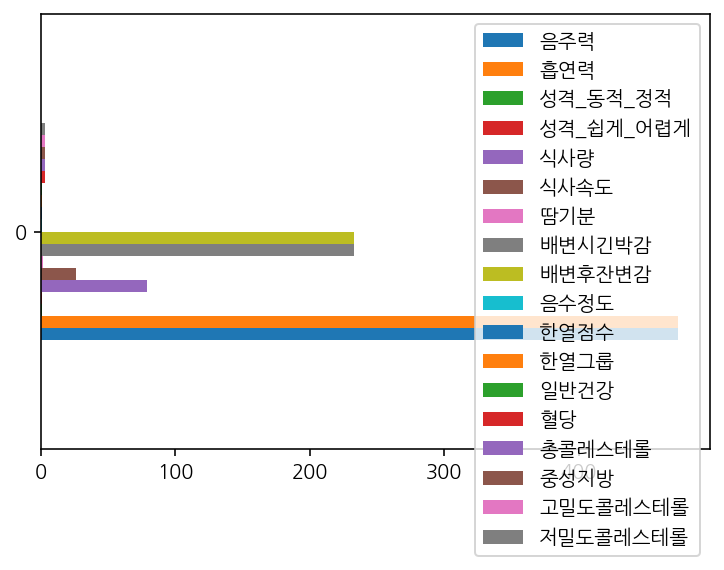

In [40]:
# 결측치가 있는 컬럼에 대해 막대 그래프로 시각화 합니다.
df_null_summary.plot.barh()

In [41]:
##위와 같이 (억지로?) dataframe로 바꾸는 것 보단,
## 일단 시리즈로 만드는 것이 더 합리적이다.
## 그리고 이렇게 해야 그래프도 우리가 원하는 y축이 생성된다.
df_null_series  = pd.Series(null_dic,index=null_dic.keys())
df_null_series

음주력          474
흡연력          474
성격_동적_정적       1
성격_쉽게_어렵게      1
식사량           79
식사속도          26
땀기분            2
배변시긴박감       233
배변후잔변감       233
음수정도           1
한열점수           1
한열그룹           1
일반건강           1
혈당             3
총콜레스테롤         3
중성지방           3
고밀도콜레스테롤       3
저밀도콜레스테롤       3
dtype: int64

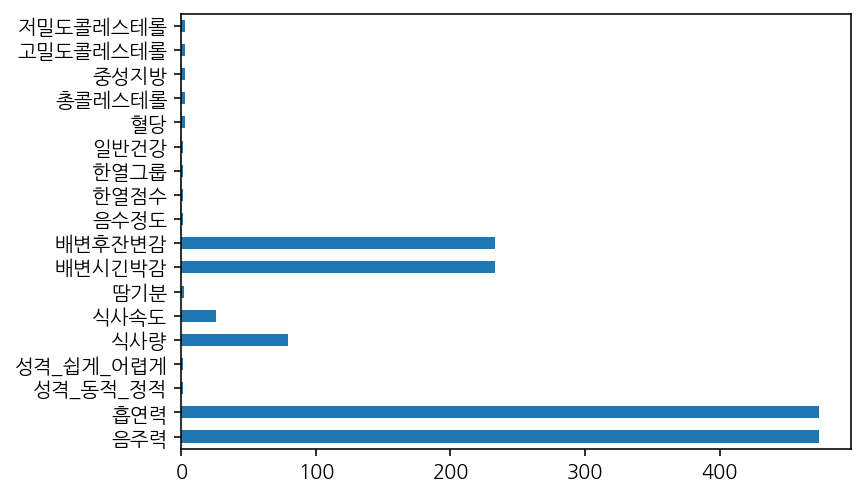

In [42]:
# (마찬가지로) 결측치가 있는 컬럼에 대해 막대 그래프로 시각화 합니다.
df_null_series.plot.barh()

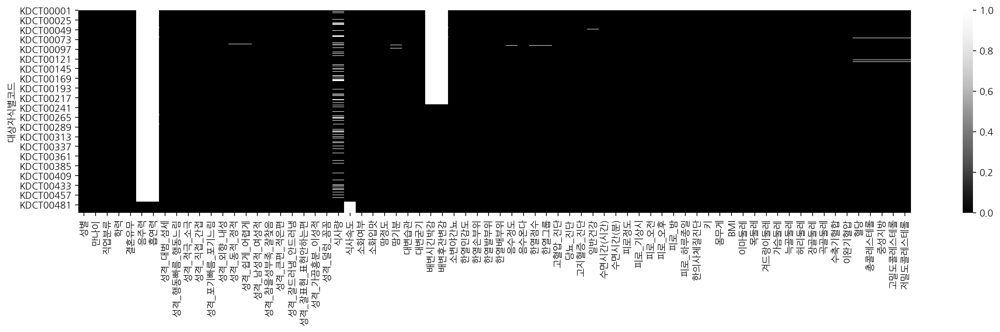

In [43]:
# 결측치 전체에 대해 heatmap 으로 시각화 합니다.
## True는 1, False는 0으로 표시하게 된다.
## 이 결과를 통해 결측치 handling에 대해 고민해봐야 한다. 
plt.figure(figsize=(20, 4))
sns.heatmap(df_null, cmap="Greys_r")

In [44]:
# #결측치가 있는 행을 제거합니다.
# df_remove = df_null.dropna(axis=0)
# df_remove.shape

#정답값
- target과 label이라고 부르기도 합니다.

In [45]:
# 정답값인 "한의사체질진단"의 갯수를 봅니다.

df["한의사체질진단"].value_counts()

1    200
3    175
2    125
Name: 한의사체질진단, dtype: int64

In [46]:
# 정답값인 "한의사체질진단" 의 비율을 봅니다.
## 1은 태음인, 3은 소양인, 2는 소음인
df["한의사체질진단"].value_counts(normalize=True)

1    0.40
3    0.35
2    0.25
Name: 한의사체질진단, dtype: float64

In [47]:
# 다른 변수와 함께 봅니다.
# "수면시간(시간)"와 정답값을 비교해 봅니다. 
# "수면시간(시간)"를 groupby 로 그룹화 해서 "한의사체질진단" 에 대한 비율을 구합니다.
# 결과를 df_bs라는 변수에 저장합니다.
##그냥 평균만 구하려고 하면, .agg(~)대신에 단순하게 .mean()으로 해주면 된다.

df_bs = df.groupby(["수면시간(시간)"])["한의사체질진단"].agg(["mean", "count"]).reset_index()
df_bs

,수면시간(시간),mean,count
0,2,1.000000,1
1,3,2.000000,4
2,4,1.666667,27
3,5,1.836207,116
4,6,2.041667,72
5,7,2.019900,201
6,8,2.014706,68
7,9,2.000000,2
8,10,1.666667,6
9,11,1.000000,1


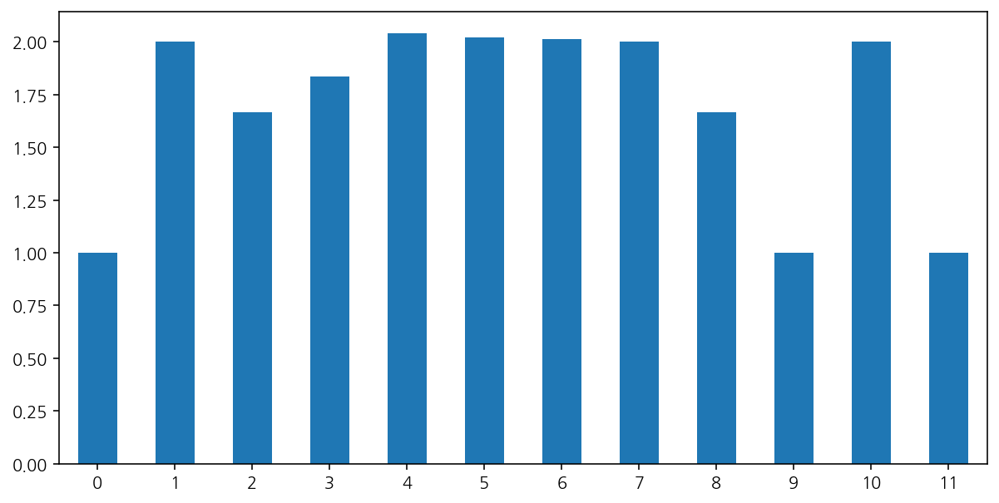

In [48]:
# 수면시간(시간)에 따른 체질진단 비율
plt.figure(figsize=(10,5))
df_bs["mean"].plot.bar(rot=0)

#Counterplot

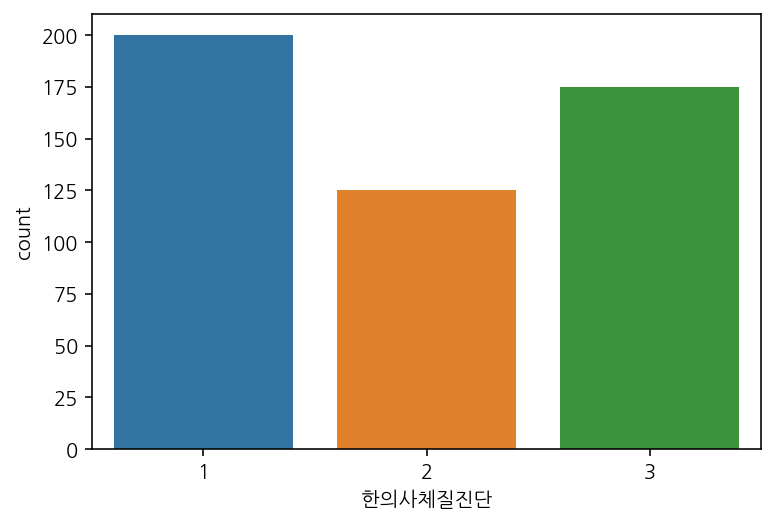

In [49]:
# 위에서 구했던 체질진단 비율을 구해봅니다.
# 체질진단 빈도수를 비교 합니다.

sns.countplot(data=df, x="한의사체질진단")

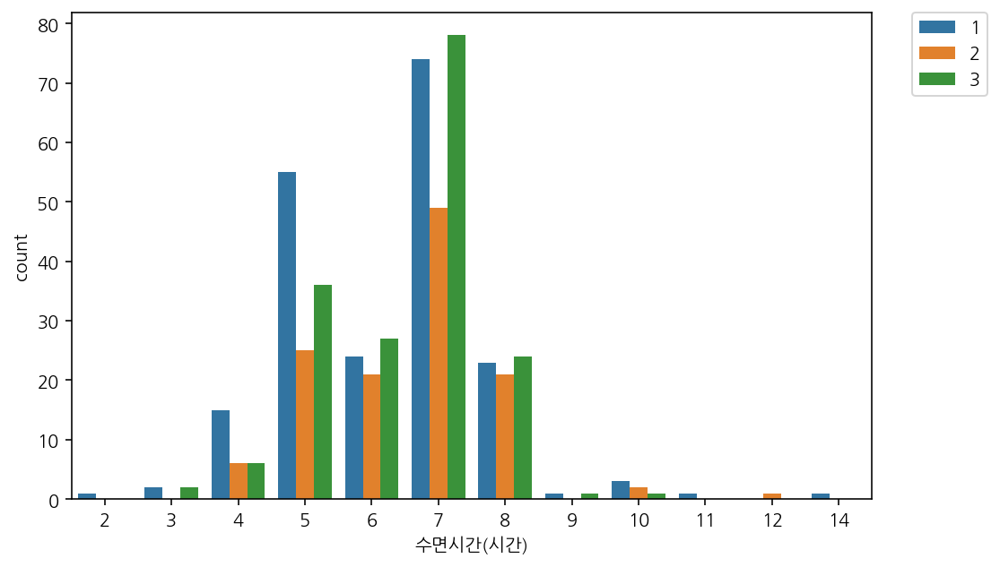

In [50]:
# 수면시간(시간)에 따른 사상체질진단 빈도수를 비교합니다.
plt.figure(figsize=(8,5))
sns.countplot(data=df, x="수면시간(시간)", hue="한의사체질진단")

# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [51]:
## 위와같이 숫자 범위가 너무 크고, 특정 범위에 갯수가 너무 적으면, 조건만 많아져서 overfitting 되기 쉽다.
## 따라서 좀더 간단한 범주형 범주로 나눈다. (이를 원-핫 인코딩 이라고 하기도 한다.)
# 수면시간이 많고 적은지 에 따라 "수면시간(시간)_부족" 변수를 만듭니다.
## 대략 6시간 기준으로 정했다.

df["수면시간(시간)_부족"] = df["수면시간(시간)"] < 6
df[["수면시간(시간)", "수면시간(시간)_부족"]].sample(10)

,수면시간(시간),수면시간(시간)_부족
대상자식별코드,,
KDCT00365,8,False
KDCT00109,7,False
KDCT00441,6,False
KDCT00409,5,True
KDCT00477,5,True
KDCT00393,6,False
KDCT00341,8,False
KDCT00070,8,False
KDCT00048,7,False


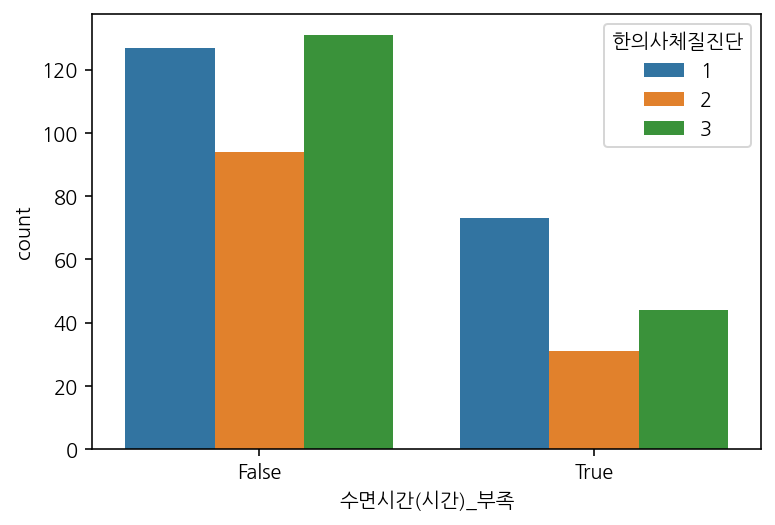

In [52]:
# "수면시간(시간)_부족" 변수의 빈도수를 countplot 으로 그리고 
# "한의사체질진단" 값에 따라 다른 색상으로 표현합니다.
sns.countplot(data=df, x="수면시간(시간)_부족", hue="한의사체질진단")

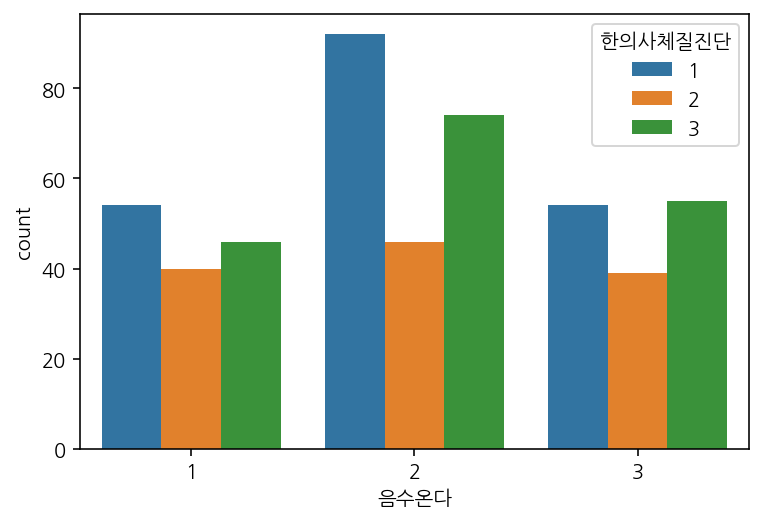

In [53]:
# "음수온다" 변수의 빈도수를 countplot 으로 그리고  
# "한의사체질진단" 값에 따라 다른 색상으로 표현합니다.
## 1=주로 따뜻한 물 2=주로찬물 3=가리지않고마신다
sns.countplot(data=df, x="음수온다", hue="한의사체질진단")

#Barplot
* 기본 설정으로 시각화 하면 y축에는 평균을 추정해서 그리게 됩니다.

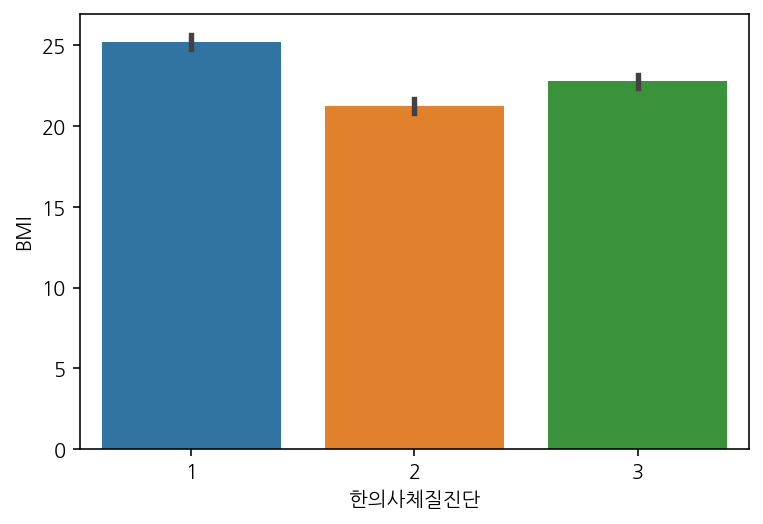

In [54]:
# “한의사체질진단”에 따른 BMI 수치를 비교합니다.

sns.barplot(data=df, x="한의사체질진단", y="BMI")

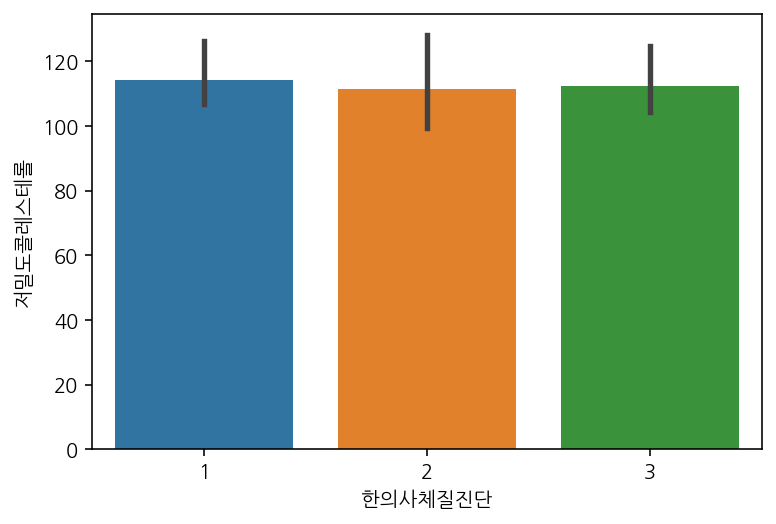

In [55]:
# "한의사체질진단"에 따른 저밀도콜레스테롤을 비교합니다.

sns.barplot(data=df, x="한의사체질진단", y="저밀도콜레스테롤")

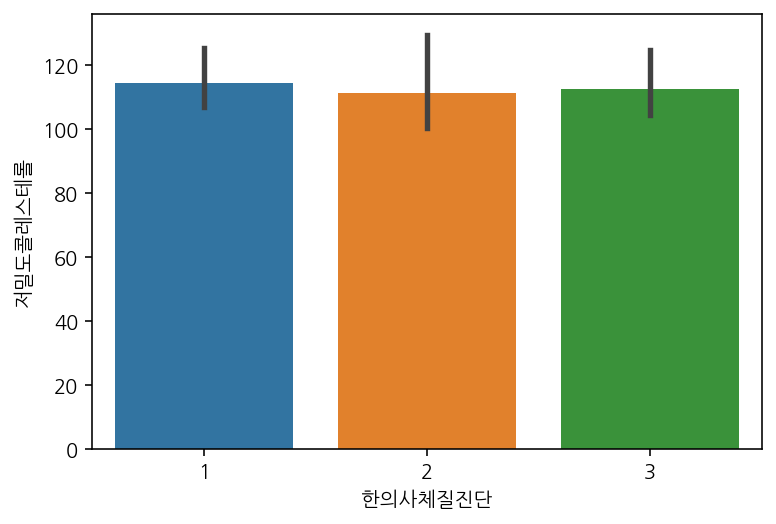

In [56]:
# "한의사체질진단"에 따른 저밀도콜레스테롤을 비교합니다.

sns.barplot(data=df, x="한의사체질진단", y="저밀도콜레스테롤")

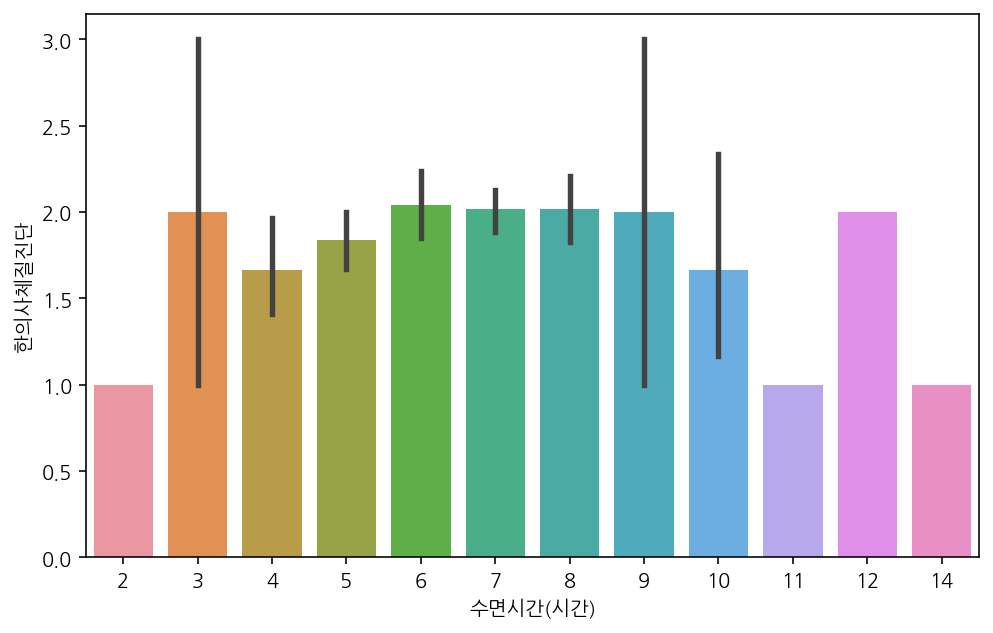

In [57]:
# 수면시간(시간)에 따른 "한의사체질진단" 비율를 비교합니다.
plt.figure(figsize=(8,5))
sns.barplot(data=df, x="수면시간(시간)", y="한의사체질진단")

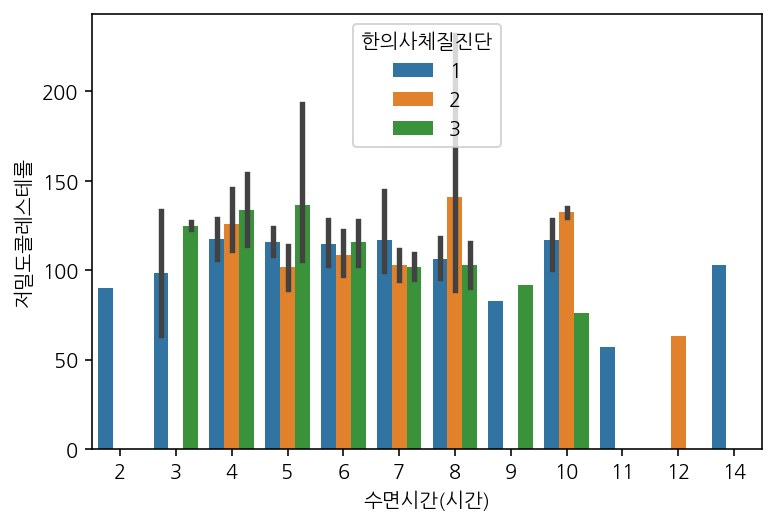

In [58]:
# "수면시간(시간)"에 따른 저밀도콜레스테롤 수치를 "한의사체질진단"에 따라 시각화 합니다.

sns.barplot(data=df, x="수면시간(시간)", y="저밀도콜레스테롤", hue="한의사체질진단")

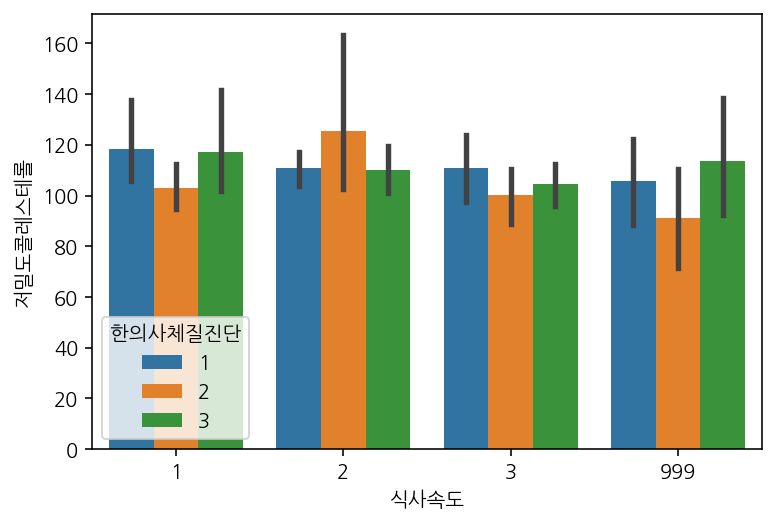

In [59]:
# "식사속도"에 따른 저밀도콜레스테롤 수치를 "한의사체질진단"에 따라 시각화 합니다.
# 1=빨리먹는다 2=중간 3=천천히 먹는다
sns.barplot(data=df, x="식사속도", y="저밀도콜레스테롤", hue="한의사체질진단")

#Boxplot

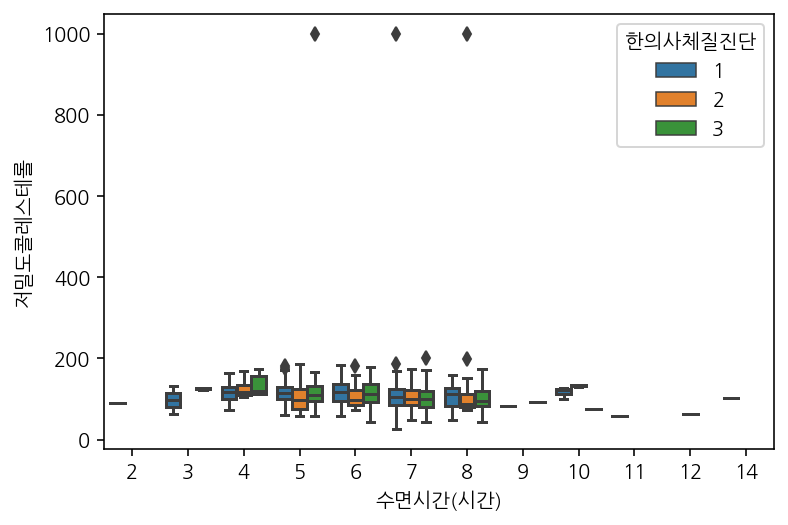

In [60]:
# "수면시간(시간)"에 따른 수축기혈합 수치를 "한의사체질진단"에 따라 시각화 합니다.

sns.boxplot(data=df, x="수면시간(시간)", y="저밀도콜레스테롤", hue="한의사체질진단")

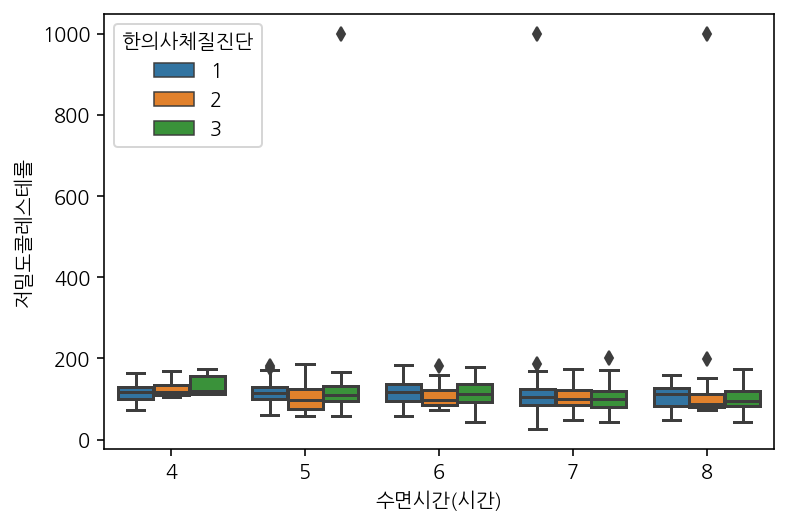

In [61]:
# 위 그래프를 수면시간에서 4시간 이상 9시간 미만에 대해서만 그려본다.
sns.boxplot(data=df[(df["수면시간(시간)"]<9) & (df["수면시간(시간)"]>=4)], 
            x="수면시간(시간)", y="저밀도콜레스테롤", hue="한의사체질진단")

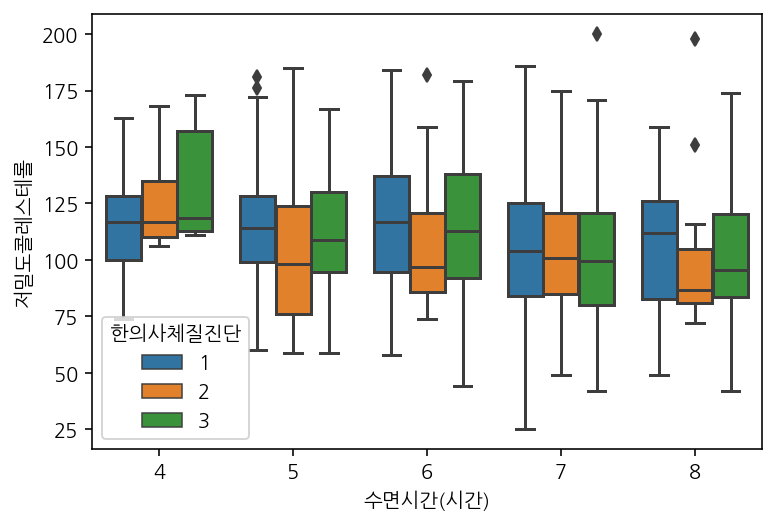

In [62]:
# 위 그래프를 수면시간에서 4시간 이상 9시간 미만에 대해서만 그려본다.
## + 결측치(999)를 제외한 값에 대해 그려본다
sns.boxplot(data=df[(df["수면시간(시간)"]<9) & (df["수면시간(시간)"]>=4) & (df["저밀도콜레스테롤"]<999)], 
            x="수면시간(시간)", y="저밀도콜레스테롤", hue="한의사체질진단")

In [63]:
## 단, 수면시간(분) 항목이 있는데 다행히 0분이 제일 많긴하다.
## 하지만 30분에 대해서는 어떻게 처리할지 고민해봐야한다.
df["수면시간(분)"].value_counts()

0     450
30     44
20      3
40      2
50      1
Name: 수면시간(분), dtype: int64

#Violinplot

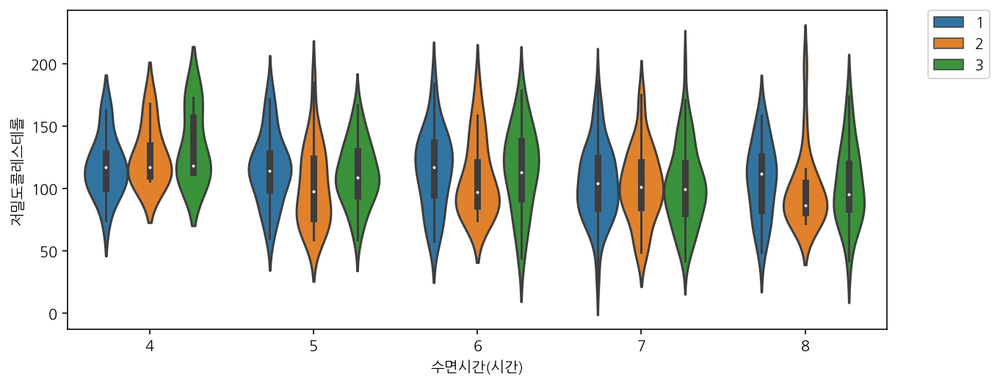

In [64]:
# 위 그래프를 violinplot으로 그려본다.
plt.figure(figsize=(10,4))
sns.violinplot(data=df[(df["수면시간(시간)"]<9) & (df["수면시간(시간)"]>=4) & (df["저밀도콜레스테롤"]<999)], 
            x="수면시간(시간)", y="저밀도콜레스테롤", hue="한의사체질진단")

# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

#Swarmplot

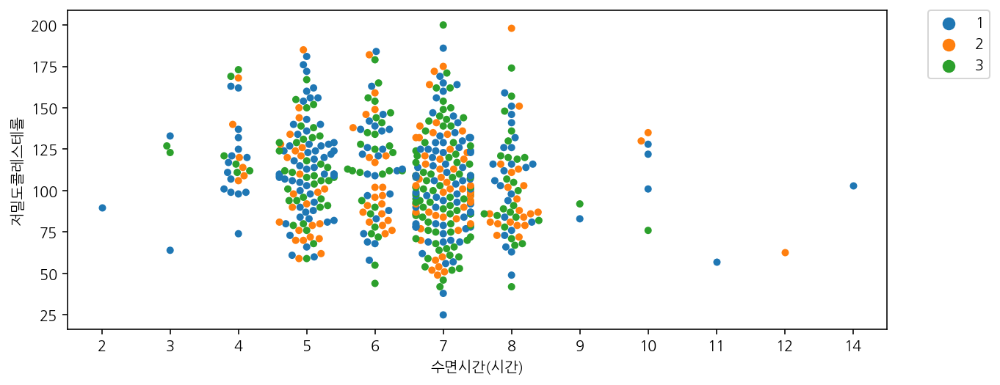

In [65]:
# 전체 데이터에 대해 swarmplot으로 그려본다.
## swamplot은 범주형 데이터의 산포도를 그리는데 적합.
## 아래와 같이 수면시간이 9시간 이상에서는 데이터 자체가 거의 없음을 눈으로 확인할 수 있다.

plt.figure(figsize=(10,4))
sns.swarmplot(data=df[df["저밀도콜레스테롤"]<999], 
            x="수면시간(시간)", y="저밀도콜레스테롤", hue="한의사체질진단")

# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

#Distplot
- 보통 한 개의 수치형(연속형) 데이터에 대해 그린다.

In [66]:
df_1 = df[df["한의사체질진단"] == 1]
df_2 = df[df["한의사체질진단"] == 2]
df_3 = df[df["한의사체질진단"] == 3]
df_1.shape, df_2.shape, df_3.shape

((200, 73), (125, 73), (175, 73))

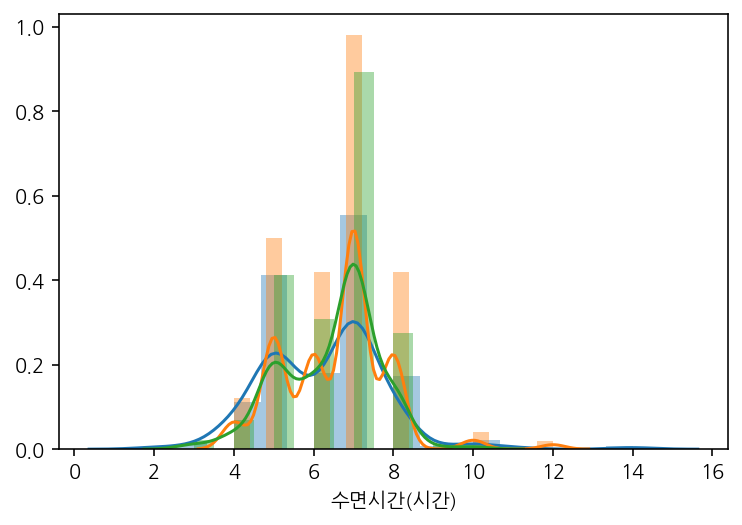

In [67]:
# 수면시간에 따른 "한의사체질진단"을 시각화 한다.
## 사용법이 조금 특이하므로 sns.displot?로 매개변수 확인하는 것을 추천

sns.distplot(df_1["수면시간(시간)"])
sns.distplot(df_2["수면시간(시간)"])
sns.distplot(df_3["수면시간(시간)"])

#파란색이 1, 주황색이 2, 초록색이 3 이다.
#소음인과 소양인이 조금 더 잠을 충분히 자는 것 같다.

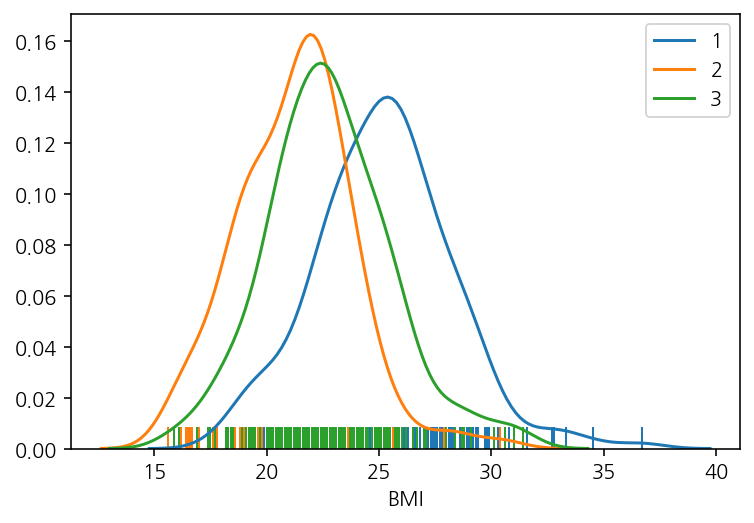

In [68]:
# bmi에 따른 "한의사체질진단"을 시각화 한다.

sns.distplot(df_1["BMI"],hist=False, rug=True, label=1)
sns.distplot(df_2["BMI"],hist=False, rug=True, label=2)
sns.distplot(df_3["BMI"],hist=False, rug=True, label=3)

#파란색이 1, 주황색이 2, 초록색이 3 이다.
#태음인이 뚜렷하게 BMI가 높다.
#이를 통해 decision tree 학습을 하는데 범주형 변수로 바꿔주는게 좋겠다고 생각이 들면,
#이 경우에는 소음소양인/태음인으로 나뉘어지는 BMI값인 24 정도로 해주면 좋을 것임을 알 수 있다.

#Subplot

##Pandas를 통한 hisplot 그리기

<string>:6: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


TypeError: ignored

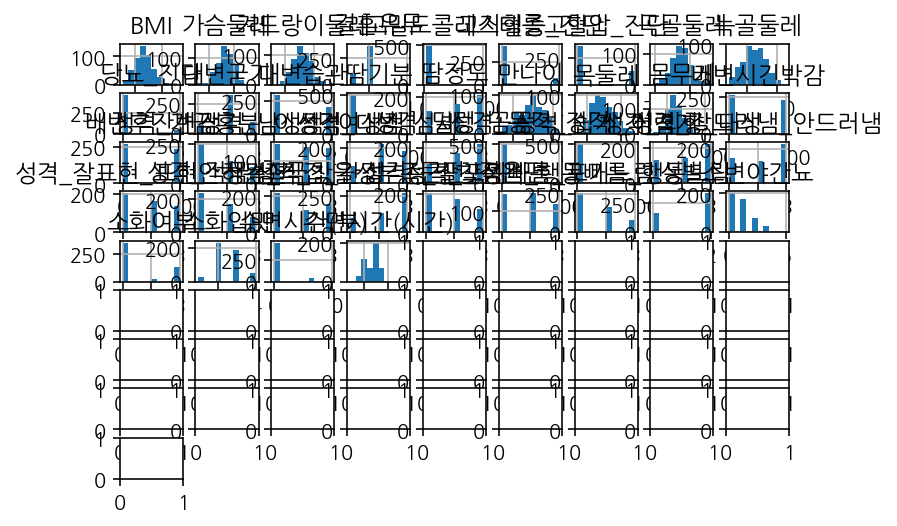

In [69]:
#곧바로 아래와 같이 df. hist()를 해주면 TypeError가 뜬다.
#왜냐하면 위에서 "수면시간(시간)_부족"에 boolean이 들어가있기 때문이다.
df.hist()

In [70]:
# 그래서 boolean을 Int로 바꿔준다.
df["수면시간(시간)_부족"] = df["수면시간(시간)_부족"].astype(int)
df

,성별,만나이,직업분류,학력,결혼유무,음주력,흡연력,성격_대범_섬세,성격_행동빠름_행동느림,성격_적극_소극,성격_직접_간접,성격_포기빠름_포기느림,성격_외향_내성,성격_동적_정적,성격_쉽게_어렵게,성격_남성적_여성적,성격_참을성부족_잘찾음,성격_큰편_적은편,성격_잘드러냄_안드러냄,성격_잘표현_표현안하는편,성격_가끔흥분_이성적,성격_덜렁_꼼꼼,식사량,식사속도,소화여부,소화입맛,땀정도,땀기분,대변습관,대변굳기,배변시긴박감,배변후잔변감,소변야간뇨,한열민감도,한열손부위,한열발부위,한열배부위,음수정도,음수온다,한열점수,한열그룹,고혈압_진단,당뇨_진단,고지혈증_진단,일반건강,수면시간(시간),수면시간(분),피로정도,피로_기상시,피로_오전,피로_오후,피로_밤,피로_하루종일,한의사체질진단,키,몸무게,BMI,이마둘레,목둘레,겨드랑이둘레,가슴둘레,늑골둘레,허리둘레,장골둘레,곡골둘레,수축기혈합,이완기혈압,혈당,총콜레스테롤,중성지방,고밀도콜레스테롤,저밀도콜레스테롤,수면시간(시간)_부족
대상자식별코드,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
KDCT00001,2,48.666,2,5,2,999,999,2,2,1,2,1,1,1,2,2,3,2,2,2,1,1,2,2,1,3,3,1,1,2,999,999,1.0,1,2,2,2,2,2,12,2,1,1,1,3,5,0,2,0,0,0,1,0,2,158.0,55.0,22.0,53.0,33.0,92.0,96.0,89.0,82.0,91.0,96.0,120,80,104,219,72,60,128,1
KDCT00002,2,80.773,14,3,2,999,999,1,1,1,1,1,1,1,2,1,3,1,1,1,1,3,2,2,1,3,1,2,1,2,999,999,1.0,2,2,2,2,2,3,13,3,1,1,1,3,5,0,4,0,0,1,0,0,3,155.0,63.0,26.2,59.0,35.0,96.0,101.0,93.0,92.0,96.0,99.0,124,65,110,199,97,46,114,1
KDCT00003,1,50.008,3,3,2,999,999,3,1,1,1,1,1,1,1,1,2,1,1,1,1,3,3,2,3,2,3,1,1,2,999,999,1.0,3,2,3,2,2,2,12,2,1,1,1,3,7,0,2,0,0,1,0,0,2,160.0,59.0,23.0,57.0,37.0,95.0,90.0,83.0,80.0,81.0,81.0,121,75,79,216,88,49,132,0
KDCT00004,2,50.551,14,4,2,999,999,1,1,1,1,1,1,1,2,1,1,1,2,1,1,2,999,1,3,2,2,3,2,2,999,999,1.0,2,2,2,2,1,2,15,3,1,1,1,4,7,0,4,0,0,1,0,0,2,165.0,76.0,27.9,59.0,37.0,100.0,104.0,90.0,91.0,94.0,99.0,113,81,100,218,136,44,136,0
KDCT00005,1,49.581,8,2,2,999,999,3,2,3,2,2,3,2,2,2,3,3,2,2,2,1,2,1,1,3,1,2,1,2,999,999,0.0,1,3,3,2,1,2,11,2,1,1,1,2,5,0,4,0,0,1,0,0,1,165.0,70.0,25.7,60.0,40.0,106.0,102.0,99.0,98.0,98.0,100.0,129,72,92,186,61,33,118,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KDCT00496,1,50.682,3,5,2,1,2,3,1,2,2,1,2,2,1,2,3,2,3,3,2,3,2,999,1,2,1,3,1,2,3,3,1.0,1,3,3,3,2,2,9,1,2,1,1,3,7,0,3,0,0,1,0,0,1,164.5,57.9,21.4,55.3,36.0,89.0,86.5,83.2,74.5,80.0,88.0,120,80,71,190,75,73,101,0
KDCT00497,2,42.542,3,5,2,2,3,3,1,3,3,1,3,3,2,3,3,2,3,3,2,3,2,999,3,3,3,3,2,2,3,3,1.0,3,3,3,2,3,1,8,1,1,1,1,3,6,0,3,0,0,1,0,0,2,157.2,41.9,17.0,53.5,32.0,73.5,76.0,67.0,64.5,76.0,79.0,110,70,74,246,86,104,117,0
KDCT00498,1,48.797,7,5,2,1,2,3,2,2,2,2,2,3,2,2,2,1,3,2,2,2,2,999,1,3,2,1,2,2,3,2,0.0,2,1,1,1,2,2,17,3,2,1,2,4,6,0,2,1,0,1,0,0,3,165.0,82.0,30.1,58.0,41.0,105.5,104.0,99.7,95.0,96.5,97.5,150,100,125,246,220,74,154,0


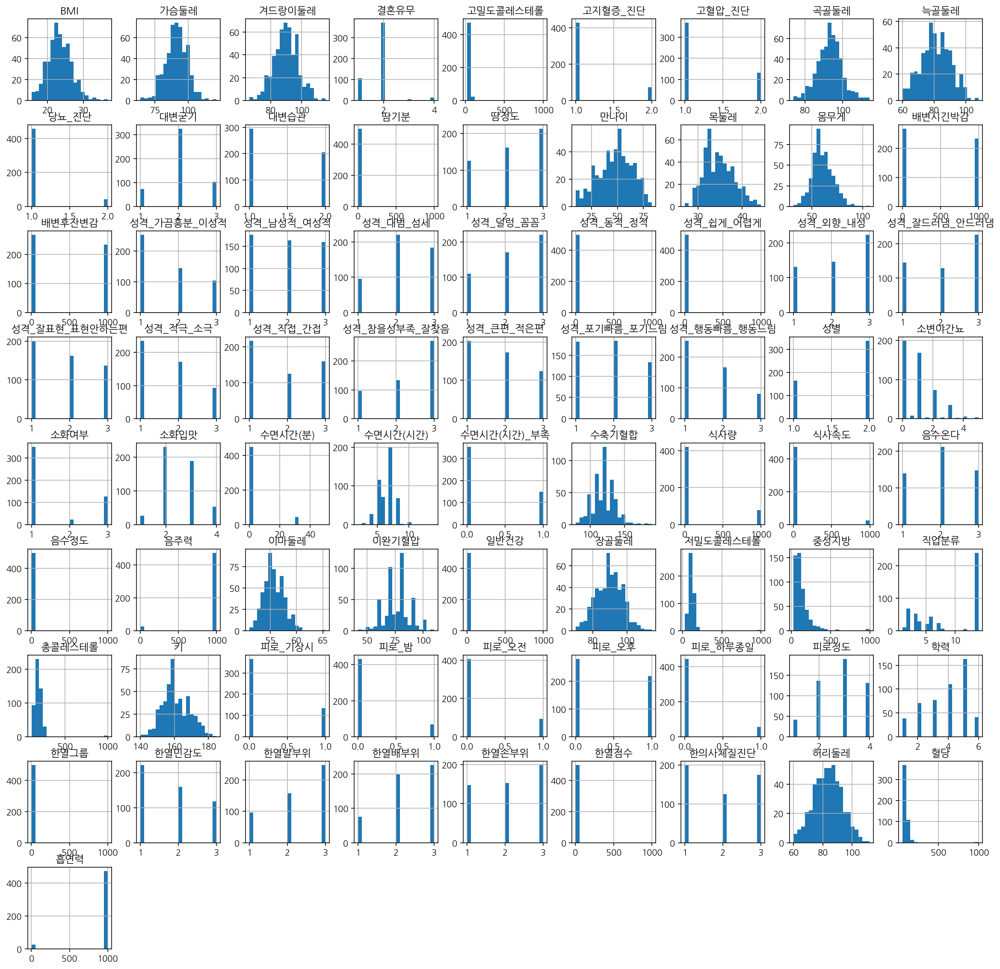

In [71]:
#히스토그램을 그려본다.
h = df.hist(figsize=(20,20), bins=20)


##반복문을 통한 서브플롯 그리기

### Distplot

In [72]:
# 컬럼의 수만큼 for 문을 만들어서 서브플롯을 시각화를 합니다.
col_num = df.columns.shape
col_num

(73,)

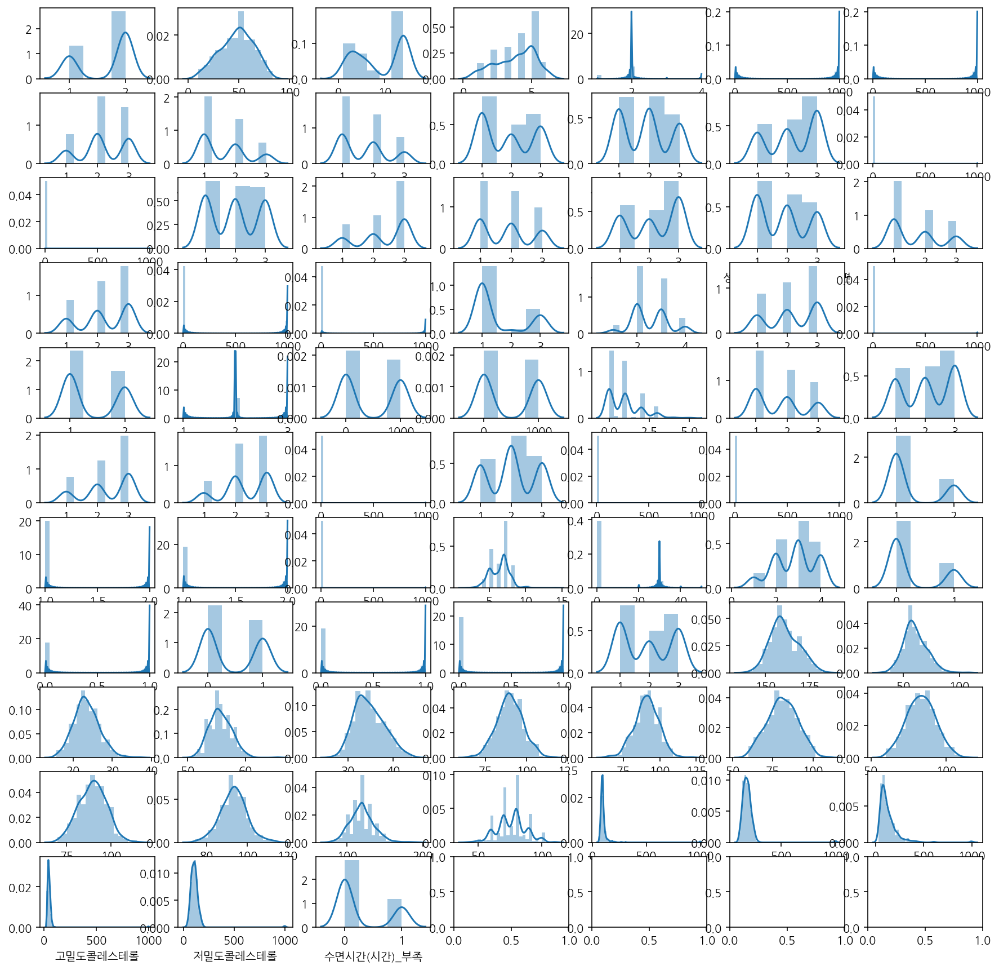

In [73]:
# distplot 으로 서브플롯을 그립니다.

# 먼저 그래프를 그릴 공간을 (11,7)로 만들어준다.
fig, axes = plt.subplots(nrows=11, ncols=7, figsize=(15,15))

# "한의사체질진단"을 제외한 컬럼을 만들어준다.
cols = df.columns.tolist()

# 그래프를 loop문을 이용하여 끼워넣어준다.
for i, col_name in enumerate(cols):
  row = i // 7   # 몫 연산자
  col = i % 7  # 나머지 연산자
  sns.distplot(df[col_name], ax=axes[row][col])

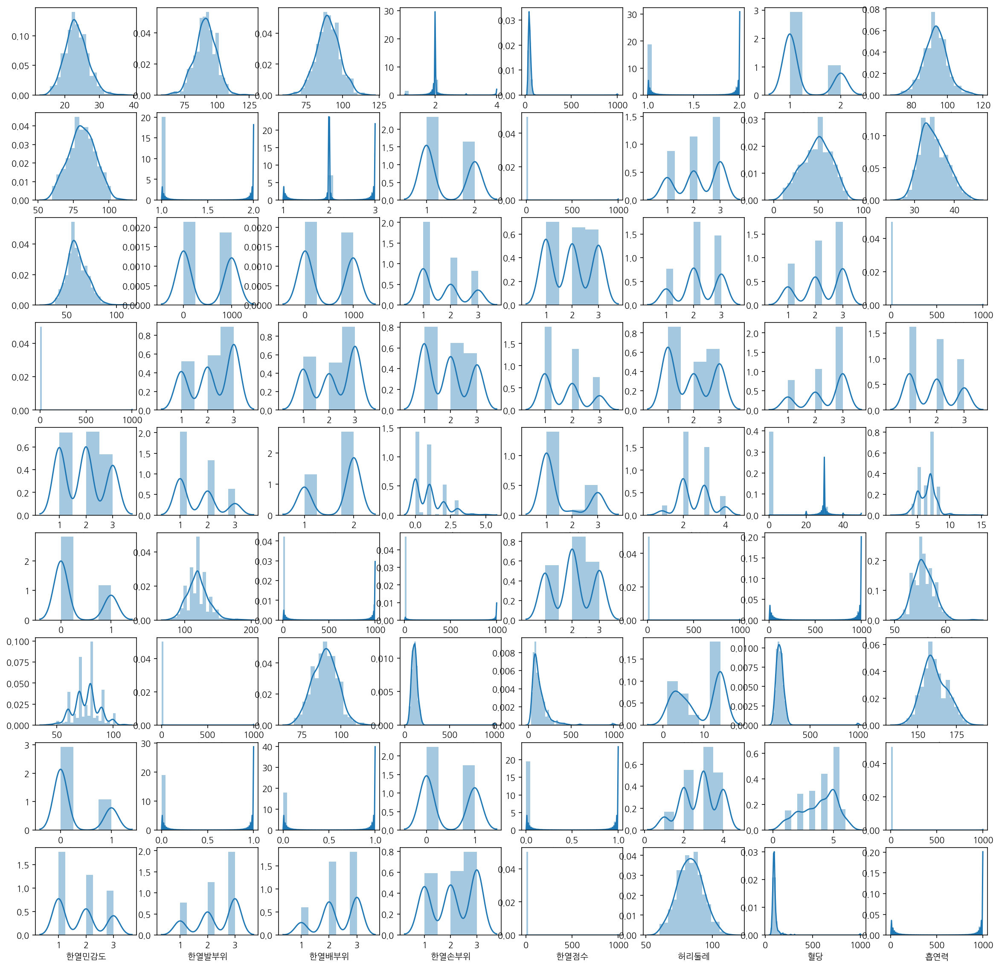

In [74]:
# distplot 으로 "한의사체질진단"을 빼고 서브플롯을 그립니다.

# 먼저 그래프를 그릴 공간을 (9,8)로 만들어준다.
fig, axes = plt.subplots(nrows=9, ncols=8, figsize=(20,20))

# "한의사체질진단"을 제외한 컬럼을 만들어준다.
cols2 = df.columns.difference(["한의사체질진단"]).tolist()

# 그래프를 loop문을 이용하여 끼워넣어준다.
for i, col_name in enumerate(cols2):
  row = i // 8   # 몫 연산자
  col = i % 8  # 나머지 연산자
  sns.distplot(df[col_name], ax=axes[row,col])

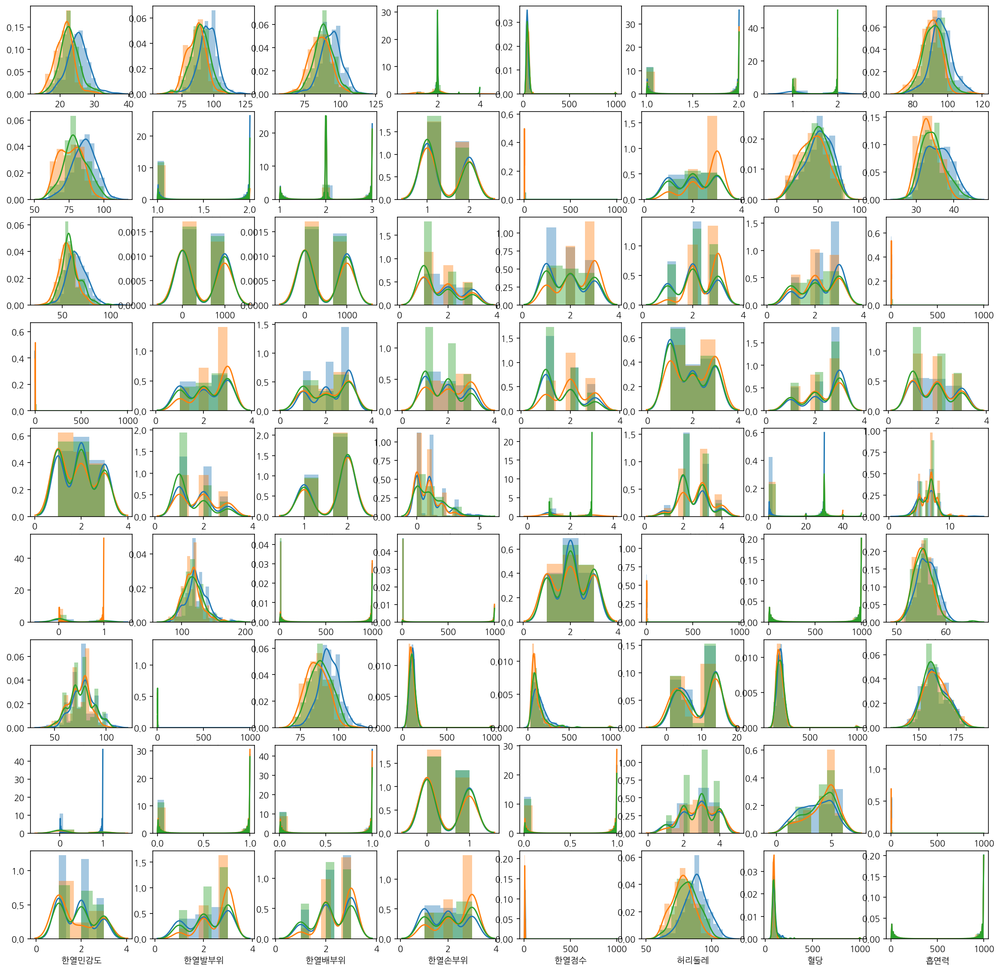

In [75]:
# distplot 으로 "한의사체질진단"을 빼고 서브플롯을 그립니다.
##이번에는 예전에 distplot에서 정의한 변수를 활용하여 "한의사체질진단" 값 별로 그려봅니다.

# 먼저 그래프를 그릴 공간을 (9,8)로 만들어준다.
fig, axes = plt.subplots(nrows=9, ncols=8, figsize=(20,20))

# "한의사체질진단"을 제외한 컬럼을 만들어준다.
cols2 = df.columns.difference(["한의사체질진단"]).tolist()

# 그래프를 loop문을 이용하여 끼워넣어준다.
for i, col_name in enumerate(cols2):
  row = i // 8   # 몫 연산자
  col = i % 8  # 나머지 연산자
  sns.distplot(df_1[col_name], ax=axes[row,col])
  sns.distplot(df_2[col_name], ax=axes[row,col])
  sns.distplot(df_3[col_name], ax=axes[row,col])

In [ ]:
# 위 그림을 통해 몇몇 수치형데이터들이 범주형 데이터로 변환이 가능할만한 것이 보인다.(반드시 해야한다는 의미는 아님)

In [15]:
## column의 명이 잘 보이지 않으니, 출력을 해줘서 직접 찾아보자.
for i, col_name in enumerate(cols2):
    print(i, col_name)
## 0번 BMI, 8번 늑골둘레 49번 장골둘레 68번 허리둘레가 범주형 데이터로 변환가능할만한 것으로 생각된다.

0 BMI
1 가슴둘레
2 겨드랑이둘레
3 결혼유무
4 고밀도콜레스테롤
5 고지혈증_진단
6 고혈압_진단
7 곡골둘레
8 늑골둘레
9 당뇨_진단
10 대변굳기
11 대변습관
12 땀기분
13 땀정도
14 만나이
15 목둘레
16 몸무게
17 배변시긴박감
18 배변후잔변감
19 성격_가끔흥분_이성적
20 성격_남성적_여성적
21 성격_대범_섬세
22 성격_덜렁_꼼꼼
23 성격_동적_정적
24 성격_쉽게_어렵게
25 성격_외향_내성
26 성격_잘드러냄_안드러냄
27 성격_잘표현_표현안하는편
28 성격_적극_소극
29 성격_직접_간접
30 성격_참을성부족_잘찾음
31 성격_큰편_적은편
32 성격_포기빠름_포기느림
33 성격_행동빠름_행동느림
34 성별
35 소변야간뇨
36 소화여부
37 소화입맛
38 수면시간(분)
39 수면시간(시간)
40 수축기혈합
41 식사량
42 식사속도
43 음수온다
44 음수정도
45 음주력
46 이마둘레
47 이완기혈압
48 일반건강
49 장골둘레
50 저밀도콜레스테롤
51 중성지방
52 직업분류
53 총콜레스테롤
54 키
55 피로_기상시
56 피로_밤
57 피로_오전
58 피로_오후
59 피로_하루종일
60 피로정도
61 학력
62 한열그룹
63 한열민감도
64 한열발부위
65 한열배부위
66 한열손부위
67 한열점수
68 허리둘레
69 혈당
70 흡연력


###Violinplot

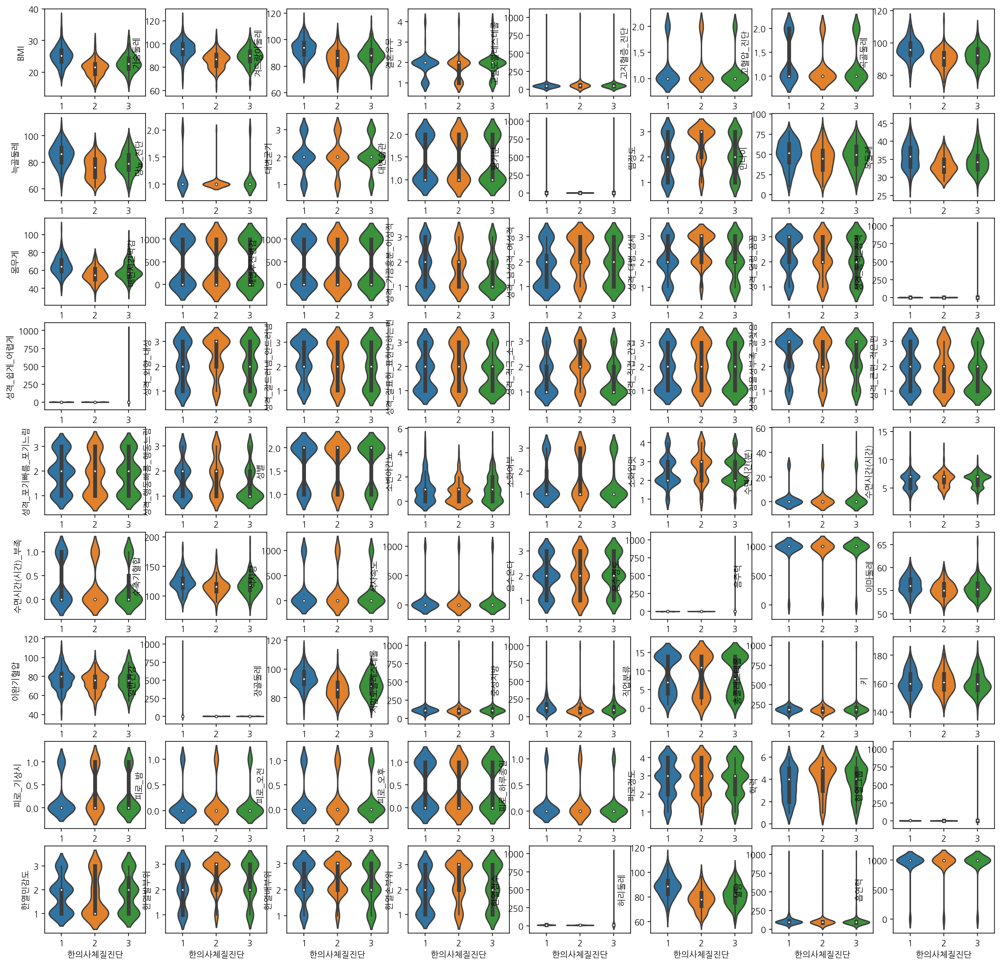

In [ ]:
# violinplot 으로 "한의사체질진단"을 빼고 서브플롯을 그립니다.
# violinplot의 매개변수에는 x와 y를 지정해줘야한다.

# 먼저 그래프를 그릴 공간을 (9,8)로 만들어준다.
fig, axes = plt.subplots(nrows=9, ncols=8, figsize=(20,20))

# "한의사체질진단"을 제외한 컬럼을 만들어준다.
cols2 = df.columns.difference(["한의사체질진단"]).tolist()

# 그래프를 loop문을 이용하여 끼워넣어준다.
for i, col_name in enumerate(cols2):
  row = i // 8   # 몫 연산자
  col = i % 8  # 나머지 연산자
  sns.violinplot(data=df, x="한의사체질진단", y=col_name, ax=axes[row,col])

### lmplot
- 상관계수가 높은 두 변수에 대해 시각화 합니다.

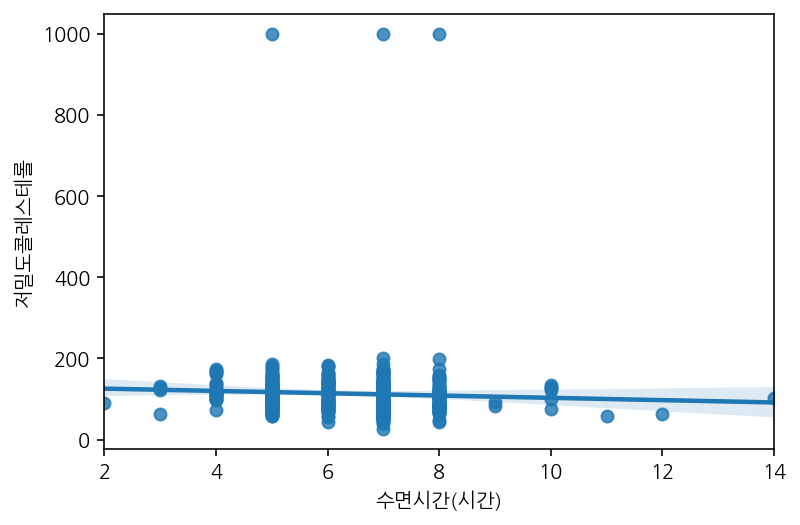

In [ ]:
# (가설..) 수면시간(시간) 과 저밀도콜레스테롤 을 한의사체질진단 으로 구분해 봅니다.
#1 먼저 회귀선을 그려줄 수 있는 regplot을 이용한다.
## 이를통해 이상치가 있음을 확인할 수 있다.
sns.regplot(data=df, x="수면시간(시간)", y="저밀도콜레스테롤")

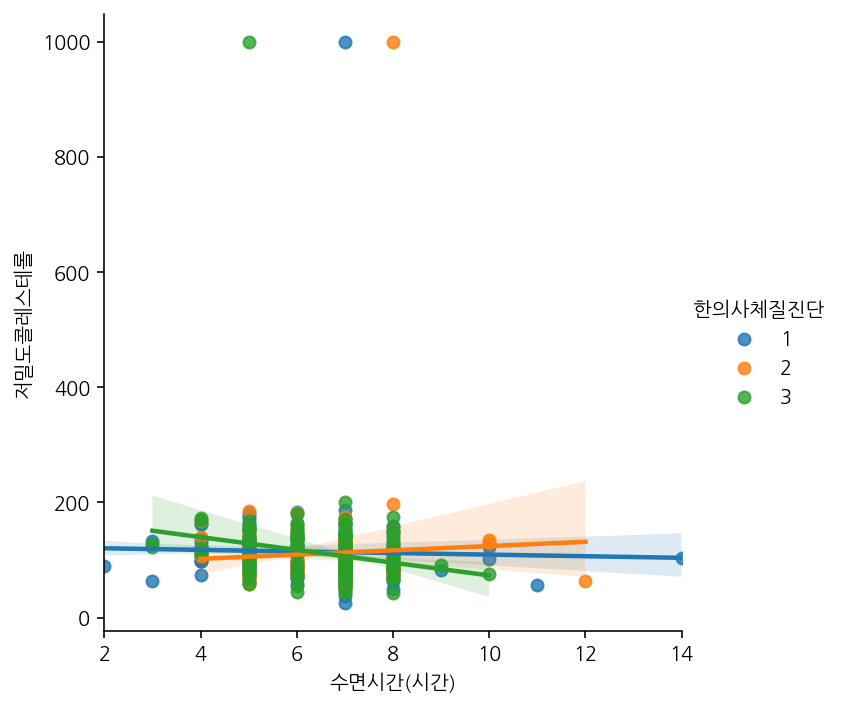

In [ ]:
#2 회귀선을 그릴 수 있으면서 hue를 넣을 수 있는 lmplot으로 사용해본다.
sns.lmplot(data=df, x="수면시간(시간)", y="저밀도콜레스테롤", hue="한의사체질진단")

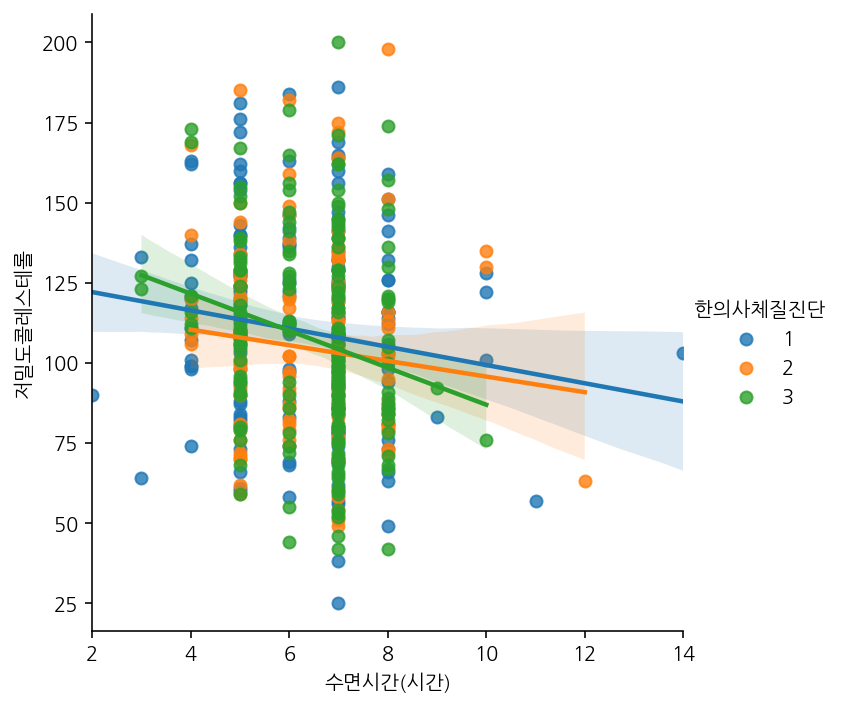

In [ ]:
# 저밀도콜레스테롤의 결측치를 없애서 그려본다
sns.lmplot(data=df[df["저밀도콜레스테롤"]<990], x="수면시간(시간)", y="저밀도콜레스테롤", hue="한의사체질진단")

In [ ]:
#위 그림을 통해 소양인의 경우가 다른 체질에 비해 수면시간이 적을수록 저밀도콜레스테롤 수치가 높아짐을 알 수 있다.

### Pairplot

In [ ]:
# PairGrid 를 통해 모든 변수에 대해 "한의사체질진단"에 따른 scatterplot을 그려봅니다.
##1 기본적으로 kind="scatter"로 되어있다.
sns.pairplot(df)

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7fe07e46c8c8> (for post_execute):


KeyboardInterrupt: ignored

Error in callback <function flush_figures at 0x7fe07e192e18> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:
##2 kind="reg"로 해서 그려본다.
sns.pairplot(df, kind="reg")

In [ ]:
##3 이제 진짜로 PairGrid를 통해 "한의사체질진단"에 에 따라 그려본다.
g = sns.PairGrid(df, hue="한의사체질진단")
g.map(plt.scatter)

# 상관 분석
* [상관 분석 - 위키백과, 우리 모두의 백과사전](https://ko.wikipedia.org/wiki/%EC%83%81%EA%B4%80_%EB%B6%84%EC%84%9D)


```
r이 -1.0과 -0.7 사이이면, 강한 음적 선형관계,
r이 -0.7과 -0.3 사이이면, 뚜렷한 음적 선형관계,
r이 -0.3과 -0.1 사이이면, 약한 음적 선형관계,
r이 -0.1과 +0.1 사이이면, 거의 무시될 수 있는 선형관계,
r이 +0.1과 +0.3 사이이면, 약한 양적 선형관계,
r이 +0.3과 +0.7 사이이면, 뚜렷한 양적 선형관계,
r이 +0.7과 +1.0 사이이면, 강한 양적 선형관계
```

In [ ]:
#우선은 결측치를 제거하지 않은 채로 한다.
df_corr = df.corr()
df_corr

,성별,만나이,직업분류,학력,결혼유무,음주력,흡연력,성격_대범_섬세,성격_행동빠름_행동느림,성격_적극_소극,성격_직접_간접,성격_포기빠름_포기느림,성격_외향_내성,성격_동적_정적,성격_쉽게_어렵게,성격_남성적_여성적,성격_참을성부족_잘찾음,성격_큰편_적은편,성격_잘드러냄_안드러냄,성격_잘표현_표현안하는편,성격_가끔흥분_이성적,성격_덜렁_꼼꼼,식사량,식사속도,소화여부,소화입맛,땀정도,땀기분,대변습관,대변굳기,배변시긴박감,배변후잔변감,소변야간뇨,한열민감도,한열손부위,한열발부위,한열배부위,음수정도,음수온다,한열점수,한열그룹,고혈압_진단,당뇨_진단,고지혈증_진단,일반건강,수면시간(시간),수면시간(분),피로정도,피로_기상시,피로_오전,피로_오후,피로_밤,피로_하루종일,한의사체질진단,키,몸무게,BMI,이마둘레,목둘레,겨드랑이둘레,가슴둘레,늑골둘레,허리둘레,장골둘레,곡골둘레,수축기혈합,이완기혈압,혈당,총콜레스테롤,중성지방,고밀도콜레스테롤,저밀도콜레스테롤,수면시간(시간)_부족
성별,1.000000,0.003177,0.239529,-0.116228,0.102332,-0.010034,-0.009997,-0.059366,0.030294,0.103473,0.046168,-0.079589,-0.082101,0.030137,0.033327,0.326349,0.009479,-0.042497,-0.153234,-0.041920,-0.046062,-0.103061,0.139217,0.010509,0.175781,0.118085,0.169013,-0.021444,0.134742,-0.073327,-0.030673,-0.030680,0.037484,0.084820,0.106799,0.096818,0.265410,-0.059661,-0.097554,-0.081797,-0.068529,-0.132439,-0.089587,-0.012740,-0.062052,-0.083455,0.039667,0.151004,-0.029316,0.107200,-0.035787,0.065915,0.072511,0.023651,-0.684974,-0.502990,-0.112566,-0.466726,-0.651037,-0.484082,-0.227418,-0.427425,-0.219344,-0.057597,-0.049817,-0.250539,-0.225262,-0.017217,0.065708,-0.134062,0.046530,0.032630,0.098397
만나이,0.003177,1.000000,0.147697,-0.406407,0.614829,-0.025133,-0.025198,-0.061938,-0.135251,-0.153808,-0.132564,-0.059230,0.025586,0.032563,0.030729,-0.069425,-0.021642,0.120701,0.043324,0.013868,0.044408,0.147783,-0.121752,0.025275,-0.087802,0.234163,-0.093412,0.086635,-0.127034,-0.011762,0.017157,0.017202,0.471947,-0.040090,-0.004438,-0.100843,-0.028987,0.048382,-0.067824,0.049295,0.048679,0.415019,0.261685,0.237711,-0.093421,-0.164051,-0.133854,-0.079706,-0.182660,-0.099375,0.065305,-0.080726,0.007663,-0.060571,-0.247998,0.085012,0.302357,-0.066941,0.260226,0.304519,0.441300,0.483400,0.473170,0.404428,0.218248,0.308363,0.248721,0.091611,0.120738,0.242144,-0.047613,0.090549,0.214777
직업분류,0.239529,0.147697,1.000000,-0.360667,0.038248,0.086781,0.086732,-0.077726,0.021695,-0.008009,-0.039402,-0.046253,-0.022140,0.043425,0.043593,0.092786,-0.032266,-0.015714,0.003445,0.008284,0.007093,-0.031072,0.096718,-0.086476,0.004298,0.159845,-0.013258,0.014722,0.102083,-0.055174,0.044417,0.044486,0.162077,0.024029,-0.001391,0.010408,0.021482,-0.033646,0.032494,-0.032725,-0.033376,0.025871,0.042736,-0.016801,0.044997,0.052533,0.012133,-0.054545,-0.072420,0.039566,-0.010226,-0.047217,0.059431,0.003144,-0.299614,-0.151949,0.026720,-0.115884,-0.145796,-0.074159,0.026585,-0.007308,0.066560,0.081218,0.045483,-0.051599,-0.076153,0.064431,0.048097,0.028498,0.030207,0.041133,0.011373
학력,-0.116228,-0.406407,-0.360667,1.000000,-0.205377,-0.016392,-0.016295,0.147653,0.050440,0.109228,0.140601,-0.006135,0.036239,-0.088092,-0.087428,0.082592,-0.092352,-0.047628,-0.090853,-0.000456,-0.067607,-0.044238,0.003248,0.016364,0.030300,-0.148635,0.163438,-0.104578,0.043520,0.048241,-0.016902,-0.016950,-0.311205,-0.056841,0.010148,0.044742,0.022742,0.005637,-0.015899,0.002235,0.004559,-0.231785,-0.097315,-0.064225,-0.057888,0.076268,0.036143,0.058473,0.119142,0.098982,0.007199,-0.008323,-0.085232,0.116277,0.367475,0.123584,-0.117826,0.113294,-0.009549,-0.041610,-0.154568,-0.203504,-0.242552,-0.175277,-0.043214,-0.117543,-0.036792,-0.213308,-0.171956,-0.244029,-0.123352,-0.173306,-0.135186
결혼유무,0.102332,0.614829,0.038248,-0.205377,1.000000,-0.042481,-0.042519,0.002389,-0.125935,-0.120857,-0.045278,-0.048021,-0.008262,0.010293,0.010313,-0.031105,0.015941,0.087390,0.060059,0.008248,0.053138,0.061020,-0.026604,0.042498,-0.107520,0.148935,-0.037099,0.126609,-0.097866,0.031223,0.007678,0.007700,0.344333,0.001019,-0.028638,-0.079767,0.060995,0.010858,-0.073254,0.009650,0.010831,0.260268,0.176284,0.172316,-0.064953,-0.095160,-0.067170,-0.041220,-0.094705,-0.032749,0.071312,0.027148,-0.078303,0.034244,-0.182248,0.025617,0.173149,-0.081630,0.102145,0.174478,0.239863,0.244859,0.275710,0.219325,0.108856,0.120734,0.121901,0.028609,0.069069,0.133430,-0.044405,0.054178,0.145954
...,...,...,...,...,...,...,...,...

In [ ]:
##가시성을 위해서 pandas의 기능을 적용하여 추가로 확인한다.
df_corr.style.background_gradient()

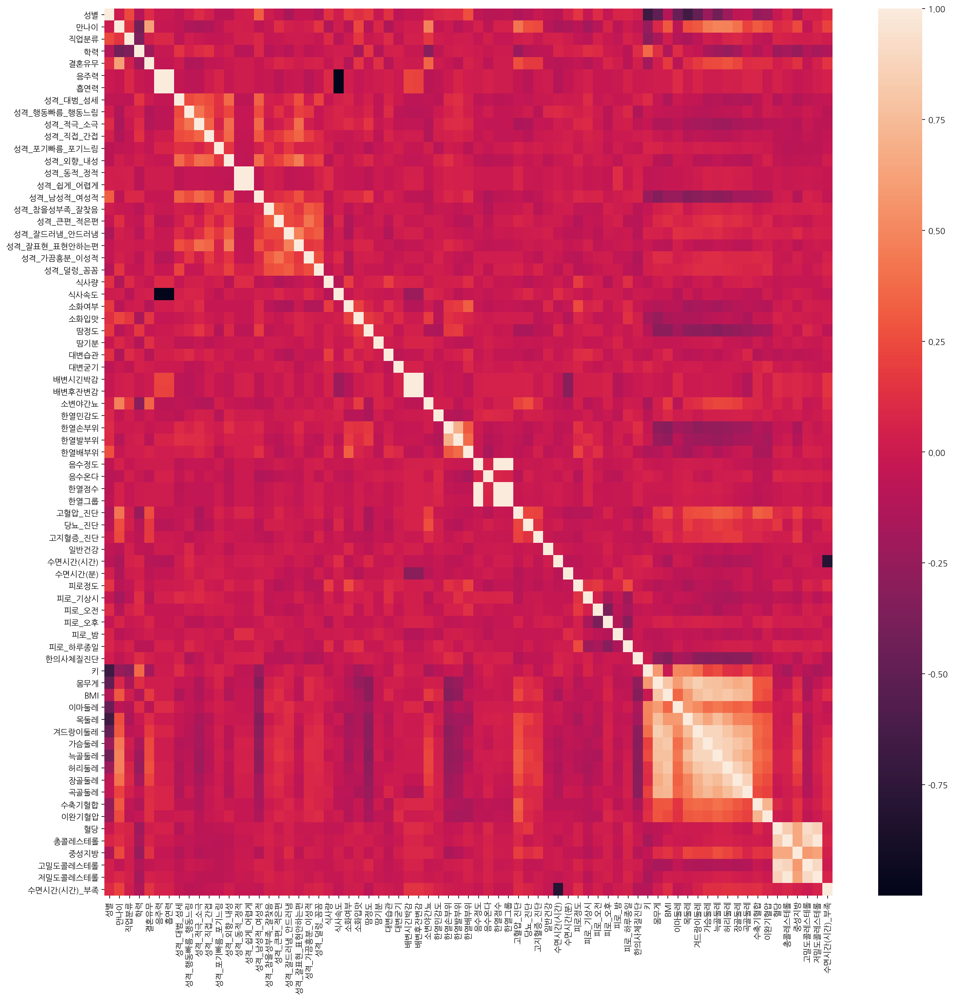

In [ ]:
# 위에서 구한 상관계수를 heatmap을 통해 표현해 봅니다.
## 데이터프레임을 통째로 넣어준다.
plt.figure(figsize=(20,20))
sns.heatmap(df_corr)

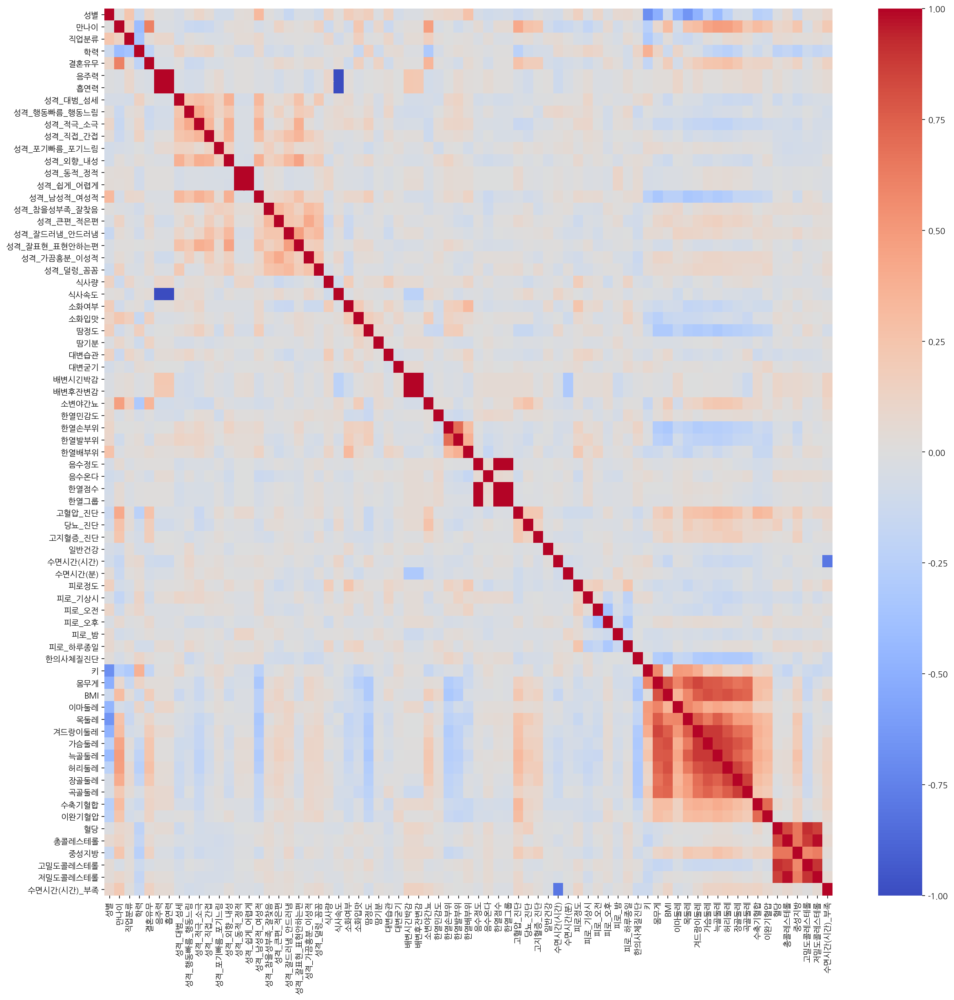

In [ ]:
# 음의 상관관계도 보려면, vmin = -1 로 지정한다.
# 양수와 음수를 확실하게 구분하기위해 cmap도 변경해준다.
plt.figure(figsize=(20,20))
sns.heatmap(df_corr, vmax=1, vmin=-1, cmap="coolwarm")

# 소수첫째자리까지해서 상관계수도 넣고싶으면 annot=True, fma='.1f'로 지정해준다.(아래의 주석 제거)
# plt.figure(figsize=(20,20))
# sns.heatmap(df_corr, annot=True, fmt='.1f', vmax=1, vmin=-1, cmap="coolwarm")

In [ ]:
# 결측치를 제외하고 데려와본다.
df_matrix = df.replace(999, np.nan)
df_matrix.head()

,성별,만나이,직업분류,학력,결혼유무,음주력,흡연력,성격_대범_섬세,성격_행동빠름_행동느림,성격_적극_소극,성격_직접_간접,성격_포기빠름_포기느림,성격_외향_내성,성격_동적_정적,성격_쉽게_어렵게,성격_남성적_여성적,성격_참을성부족_잘찾음,성격_큰편_적은편,성격_잘드러냄_안드러냄,성격_잘표현_표현안하는편,성격_가끔흥분_이성적,성격_덜렁_꼼꼼,식사량,식사속도,소화여부,소화입맛,땀정도,땀기분,대변습관,대변굳기,배변시긴박감,배변후잔변감,소변야간뇨,한열민감도,한열손부위,한열발부위,한열배부위,음수정도,음수온다,한열점수,한열그룹,고혈압_진단,당뇨_진단,고지혈증_진단,일반건강,수면시간(시간),수면시간(분),피로정도,피로_기상시,피로_오전,피로_오후,피로_밤,피로_하루종일,한의사체질진단,키,몸무게,BMI,이마둘레,목둘레,겨드랑이둘레,가슴둘레,늑골둘레,허리둘레,장골둘레,곡골둘레,수축기혈합,이완기혈압,혈당,총콜레스테롤,중성지방,고밀도콜레스테롤,저밀도콜레스테롤,수면시간(시간)_부족
대상자식별코드,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
KDCT00001,2,48.666,2,5,2,NaN,NaN,2,2,1,2,1,1,1.0,2.0,2,3,2,2,2,1,1,2.0,2.0,1,3,3,1.0,1,2,NaN,NaN,1.0,1,2,2,2,2.0,2,12.0,2.0,1,1,1,3.0,5,0,2,0,0,0,1,0,2,158.0,55.0,22.0,53.0,33.0,92.0,96.0,89.0,82.0,91.0,96.0,120,80,104.0,219.0,72.0,60.0,128.0,1
KDCT00002,2,80.773,14,3,2,NaN,NaN,1,1,1,1,1,1,1.0,2.0,1,3,1,1,1,1,3,2.0,2.0,1,3,1,2.0,1,2,NaN,NaN,1.0,2,2,2,2,2.0,3,13.0,3.0,1,1,1,3.0,5,0,4,0,0,1,0,0,3,155.0,63.0,26.2,59.0,35.0,96.0,101.0,93.0,92.0,96.0,99.0,124,65,110.0,199.0,97.0,46.0,114.0,1
KDCT00003,1,50.008,3,3,2,NaN,NaN,3,1,1,1,1,1,1.0,1.0,1,2,1,1,1,1,3,3.0,2.0,3,2,3,1.0,1,2,NaN,NaN,1.0,3,2,3,2,2.0,2,12.0,2.0,1,1,1,3.0,7,0,2,0,0,1,0,0,2,160.0,59.0,23.0,57.0,37.0,95.0,90.0,83.0,80.0,81.0,81.0,121,75,79.0,216.0,88.0,49.0,132.0,0
KDCT00004,2,50.551,14,4,2,NaN,NaN,1,1,1,1,1,1,1.0,2.0,1,1,1,2,1,1,2,NaN,1.0,3,2,2,3.0,2,2,NaN,NaN,1.0,2,2,2,2,1.0,2,15.0,3.0,1,1,1,4.0,7,0,4,0,0,1,0,0,2,165.0,76.0,27.9,59.0,37.0,100.0,104.0,90.0,91.0,94.0,99.0,113,81,100.0,218.0,136.0,44.0,136.0,0
KDCT00005,1,49.581,8,2,2,NaN,NaN,3,2,3,2,2,3,2.0,2.0,2,3,3,2,2,2,1,2.0,1.0,1,3,1,2.0,1,2,NaN,NaN,0.0,1,3,3,2,1.0,2,11.0,2.0,1,1,1,2.0,5,0,4,0,0,1,0,0,1,165.0,70.0,25.7,60.0,40.0,106.0,102.0,99.0,98.0,98.0,100.0,129,72,92.0,186.0,61.0,33.0,118.0,1


In [ ]:
##위와 마찬가지로 이제 새로운 결측치를 제거한 df로 상관계수를 구해본다.
df_corr_m = df_matrix.corr()
df_corr_m.style.background_gradient()

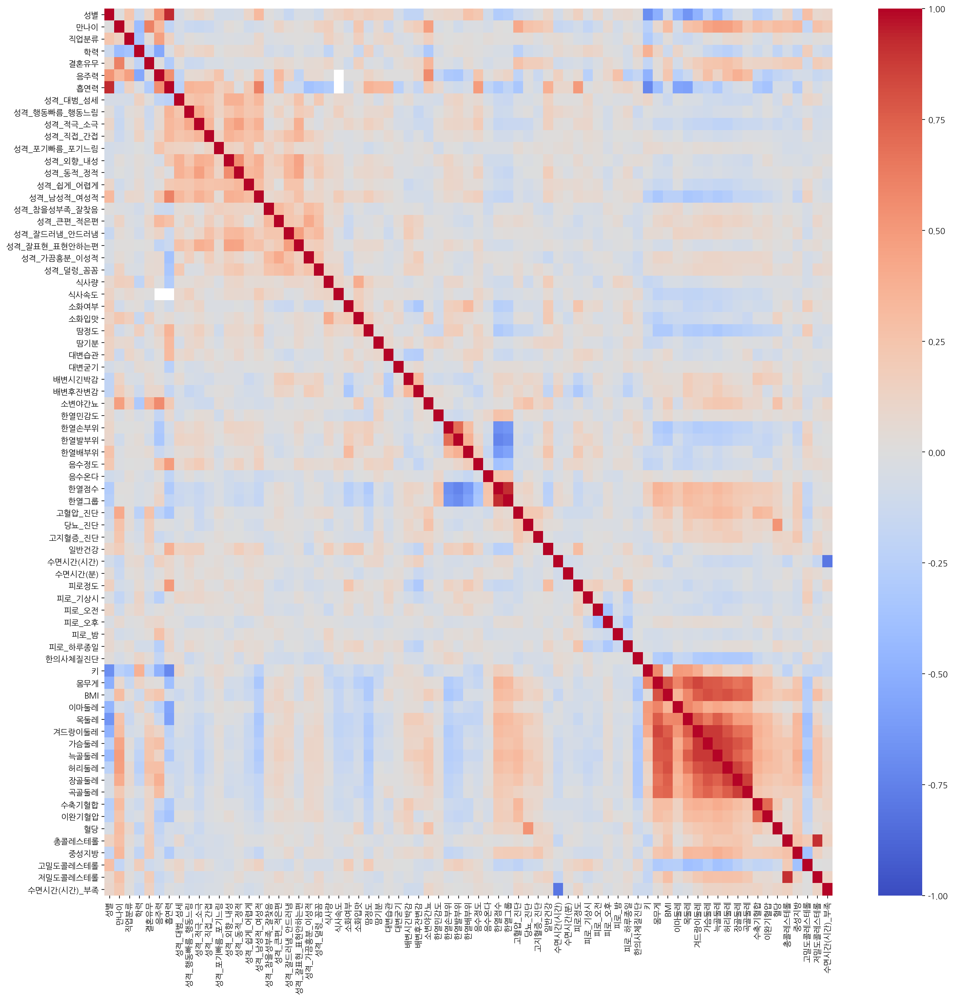

In [ ]:
# heatmap도 그려본다.
plt.figure(figsize=(20,20))
sns.heatmap(df_corr_m, vmax=1, vmin=-1, cmap="coolwarm")

In [ ]:
#"한의사체질진단"에 대한 상관계수만 모아서 봅니다.
df_corr_m["한의사체질진단"]

성별             0.023651
만나이           -0.060571
직업분류           0.003144
학력             0.116277
결혼유무           0.034244
                 ...   
총콜레스테롤        -0.034524
중성지방          -0.128766
고밀도콜레스테롤       0.113801
저밀도콜레스테롤      -0.038715
수면시간(시간)_부족   -0.109458
Name: 한의사체질진단, Length: 73, dtype: float64

In [ ]:
##1 내림차순으로 본다.
#양의 상관관계를 알 수 있다.
df_corr_m["한의사체질진단"].sort_values(ascending=False)

한의사체질진단     1.000000
한열손부위       0.121846
학력          0.116277
고밀도콜레스테롤    0.113801
한열발부위       0.079635
              ...   
겨드랑이둘레     -0.294503
장골둘레       -0.307575
허리둘레       -0.314393
가슴둘레       -0.320247
BMI        -0.334141
Name: 한의사체질진단, Length: 73, dtype: float64

In [ ]:
##2 오름차순으로 본다.
#음의 상관관계를 알 수 있다.
df_corr_m["한의사체질진단"].sort_values(ascending=True)

BMI        -0.334141
가슴둘레       -0.320247
허리둘레       -0.314393
장골둘레       -0.307575
겨드랑이둘레     -0.294503
              ...   
한열발부위       0.079635
고밀도콜레스테롤    0.113801
학력          0.116277
한열손부위       0.121846
한의사체질진단     1.000000
Name: 한의사체질진단, Length: 73, dtype: float64

In [ ]:
##아무래도 한의사체질진단 의 값이 one-hot encoding이 아니고, 
##어떤 태음인(1) - 소음인(2) - 소양인(3) 순서로 나뉘는게 아니기 떄문이다.
##"한의사체질진단"이라는 outcome 형태로 보아 이러한 방식의 회귀분석은 적합하지 않은 것으로 보인다.

##(스스로) 더미변수만들기

In [ ]:
#"한의사체질진단"부분을 더미변수로 만들어준다.
df_matrix3 = pd.get_dummies(df_matrix, columns=["한의사체질진단"])
df_matrix3

,성별,만나이,직업분류,학력,결혼유무,음주력,흡연력,성격_대범_섬세,성격_행동빠름_행동느림,성격_적극_소극,성격_직접_간접,성격_포기빠름_포기느림,성격_외향_내성,성격_동적_정적,성격_쉽게_어렵게,성격_남성적_여성적,성격_참을성부족_잘찾음,성격_큰편_적은편,성격_잘드러냄_안드러냄,성격_잘표현_표현안하는편,성격_가끔흥분_이성적,성격_덜렁_꼼꼼,식사량,식사속도,소화여부,소화입맛,땀정도,땀기분,대변습관,대변굳기,배변시긴박감,배변후잔변감,소변야간뇨,한열민감도,한열손부위,한열발부위,한열배부위,음수정도,음수온다,한열점수,한열그룹,고혈압_진단,당뇨_진단,고지혈증_진단,일반건강,수면시간(시간),수면시간(분),피로정도,피로_기상시,피로_오전,피로_오후,피로_밤,피로_하루종일,키,몸무게,BMI,이마둘레,목둘레,겨드랑이둘레,가슴둘레,늑골둘레,허리둘레,장골둘레,곡골둘레,수축기혈합,이완기혈압,혈당,총콜레스테롤,중성지방,고밀도콜레스테롤,저밀도콜레스테롤,수면시간(시간)_부족,한의사체질진단_1,한의사체질진단_2,한의사체질진단_3
대상자식별코드,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
KDCT00001,2,48.666,2,5,2,NaN,NaN,2,2,1,2,1,1,1.0,2.0,2,3,2,2,2,1,1,2.0,2.0,1,3,3,1.0,1,2,NaN,NaN,1.0,1,2,2,2,2.0,2,12.0,2.0,1,1,1,3.0,5,0,2,0,0,0,1,0,158.0,55.0,22.0,53.0,33.0,92.0,96.0,89.0,82.0,91.0,96.0,120,80,104.0,219.0,72.0,60.0,128.0,1,0,1,0
KDCT00002,2,80.773,14,3,2,NaN,NaN,1,1,1,1,1,1,1.0,2.0,1,3,1,1,1,1,3,2.0,2.0,1,3,1,2.0,1,2,NaN,NaN,1.0,2,2,2,2,2.0,3,13.0,3.0,1,1,1,3.0,5,0,4,0,0,1,0,0,155.0,63.0,26.2,59.0,35.0,96.0,101.0,93.0,92.0,96.0,99.0,124,65,110.0,199.0,97.0,46.0,114.0,1,0,0,1
KDCT00003,1,50.008,3,3,2,NaN,NaN,3,1,1,1,1,1,1.0,1.0,1,2,1,1,1,1,3,3.0,2.0,3,2,3,1.0,1,2,NaN,NaN,1.0,3,2,3,2,2.0,2,12.0,2.0,1,1,1,3.0,7,0,2,0,0,1,0,0,160.0,59.0,23.0,57.0,37.0,95.0,90.0,83.0,80.0,81.0,81.0,121,75,79.0,216.0,88.0,49.0,132.0,0,0,1,0
KDCT00004,2,50.551,14,4,2,NaN,NaN,1,1,1,1,1,1,1.0,2.0,1,1,1,2,1,1,2,NaN,1.0,3,2,2,3.0,2,2,NaN,NaN,1.0,2,2,2,2,1.0,2,15.0,3.0,1,1,1,4.0,7,0,4,0,0,1,0,0,165.0,76.0,27.9,59.0,37.0,100.0,104.0,90.0,91.0,94.0,99.0,113,81,100.0,218.0,136.0,44.0,136.0,0,0,1,0
KDCT00005,1,49.581,8,2,2,NaN,NaN,3,2,3,2,2,3,2.0,2.0,2,3,3,2,2,2,1,2.0,1.0,1,3,1,2.0,1,2,NaN,NaN,0.0,1,3,3,2,1.0,2,11.0,2.0,1,1,1,2.0,5,0,4,0,0,1,0,0,165.0,70.0,25.7,60.0,40.0,106.0,102.0,99.0,98.0,98.0,100.0,129,72,92.0,186.0,61.0,33.0,118.0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KDCT00496,1,50.682,3,5,2,1.0,2.0,3,1,2,2,1,2,2.0,1.0,2,3,2,3,3,2,3,2.0,NaN,1,2,1,3.0,1,2,3.0,3.0,1.0,1,3,3,3,2.0,2,9.0,1.0,2,1,1,3.0,7,0,3,0,0,1,0,0,164.5,57.9,21.4,55.3,36.0,89.0,86.5,83.2,74.5,80.0,88.0,120,80,71.0,190.0,75.0,73.0,101.0,0,1,0,0
KDCT00497,2,42.542,3,5,2,2.0,3.0,3,1,3,3,1,3,3.0,2.0,3,3,2,3,3,2,3,2.0,NaN,3,3,3,3.0,2,2,3.0,3.0,1.0,3,3,3,2,3.0,1,8.0,1.0,1,1,1,3.0,6,0,3,0,0,1,0,0,157.2,41.9,17.0,53.5,32.0,73.5,76.0,67.0,64.5,76.0,79.0,110,70,74.0,246.0,86.0,104.0,117.0,0,0,1,0
KDCT00498,1,48.797,7,5,2,1.0,2.0,3,2,2,2,2,2,3.0,2.0,2,2,1,3,2,2,2,2.0,NaN,1,3,2,1.0,2,2,3.0,2.0,0.0,2,1,1,1,2.0,2,17.0,3.0,2,1,2,4.0,6,0,2,1,0,1,0,0,165.0,82.0,30.1,58.0,41.0,105.5,104.0,99.7,95.0,96.5,97.5,150,100,125.0,246.0,220.0,74.0,154.0,0,0,0,1


In [ ]:
df_matrix3_corr = df_matrix3.corr()
df_matrix3_corr.style.background_gradient()

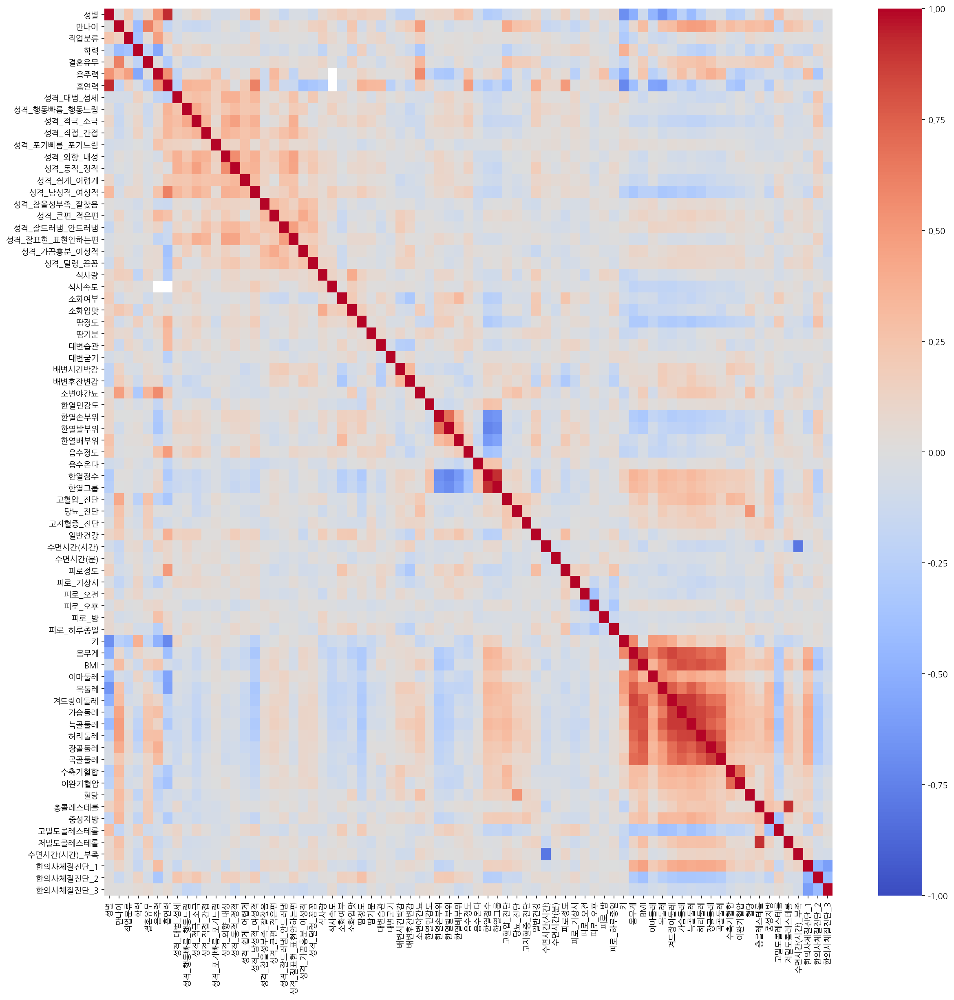

In [ ]:
# heatmap도 그려본다.
plt.figure(figsize=(20,20))
sns.heatmap(df_matrix3_corr, vmax=1, vmin=-1, cmap="coolwarm")

In [ ]:
##1 태음인의 상관관계 보기.
df_matrix3_corr["한의사체질진단_1"].sort_values(ascending=False)

한의사체질진단_1    1.000000
BMI          0.460805
가슴둘레         0.428506
허리둘레         0.420579
장골둘레         0.407502
               ...   
한열발부위       -0.160921
고밀도콜레스테롤    -0.164859
한열손부위       -0.194545
한의사체질진단_2   -0.471405
한의사체질진단_3   -0.599145
Name: 한의사체질진단_1, Length: 75, dtype: float64

In [ ]:
##2 소음인 상관관계 보기.
df_matrix3_corr["한의사체질진단_2"].sort_values(ascending=False)

한의사체질진단_2    1.000000
땀정도          0.270296
성격_대범_섬세     0.241310
성격_적극_소극     0.234437
한열발부위        0.205119
               ...   
가슴둘레        -0.330171
음주력         -0.331606
BMI         -0.375517
한의사체질진단_3   -0.423659
한의사체질진단_1   -0.471405
Name: 한의사체질진단_2, Length: 75, dtype: float64

In [ ]:
##3 소양인 상관관계 보기.
df_matrix3_corr["한의사체질진단_3"].sort_values(ascending=False)

한의사체질진단_3       1.000000
한열그룹            0.082576
한열점수            0.080667
결혼유무            0.065010
한열민감도           0.059905
                  ...   
성격_동적_정적       -0.153627
성격_적극_소극       -0.161973
성격_행동빠름_행동느림   -0.184096
한의사체질진단_2      -0.423659
한의사체질진단_1      -0.599145
Name: 한의사체질진단_3, Length: 75, dtype: float64

##상관계수 높은 변수끼리 보기

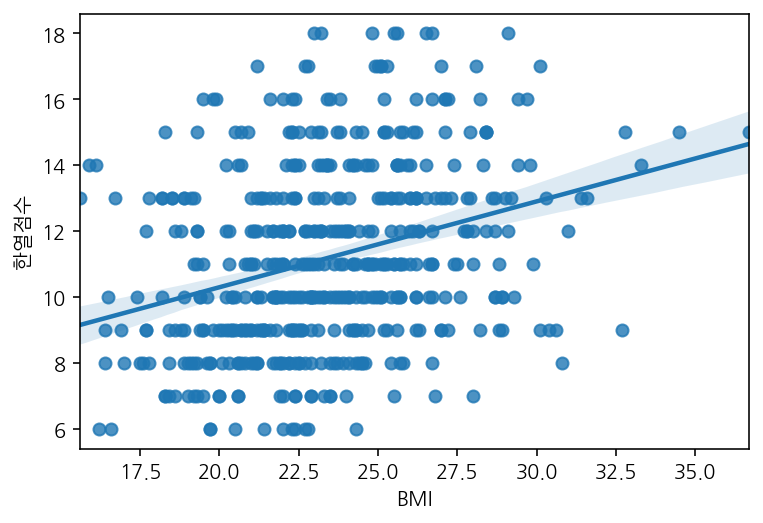

In [ ]:
# "BMI"와 "한열점수"로 regplot 그리기
sns.regplot(data=df_matrix, x="BMI", y="한열점수")

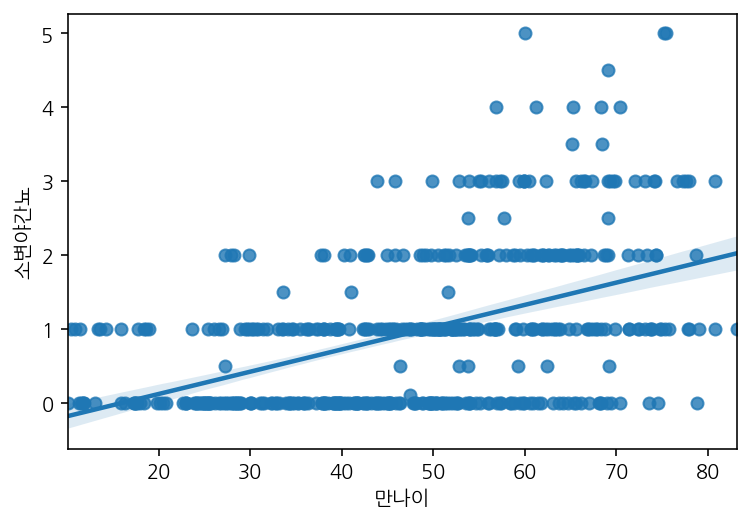

In [ ]:
# 만나이 와 소변야간뇨 로 replot 그리기
sns.regplot(data=df_matrix, x="만나이", y="소변야간뇨")


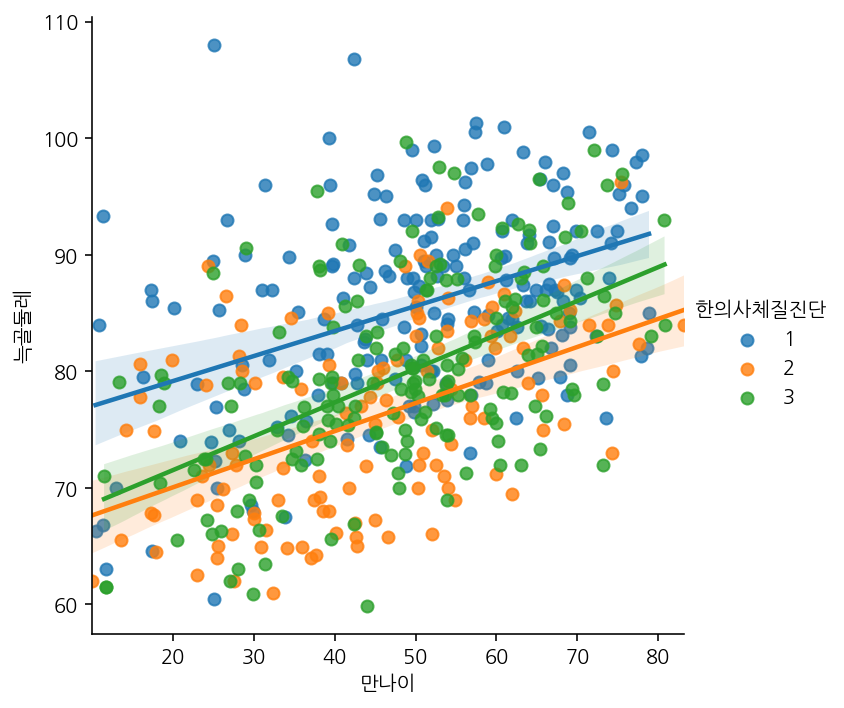

In [ ]:
# 만나이 와 늑골점수 로 lmplot 을 그리고 "한의사체질진단" 에 따라 다른 색사으로 표현하기
##1 regplot에는 hue 를 지원하지 않으므로 lmplot을 사용

sns.lmplot(data=df, x="만나이", y="늑골둘레", hue="한의사체질진단")

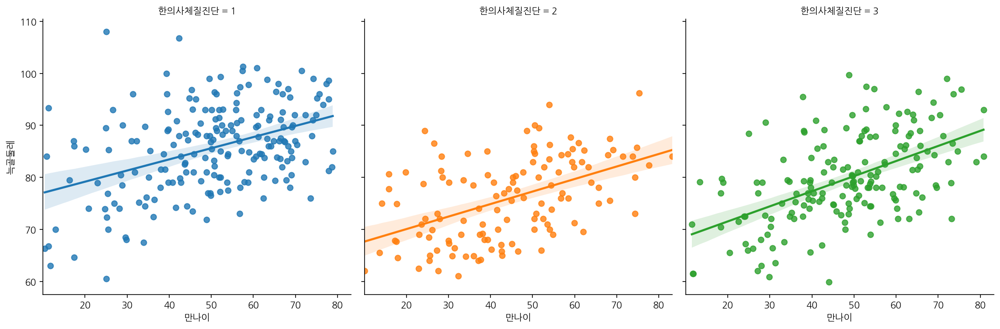

In [ ]:
##2 subplot으로 나눠서 그릴 수도 있다.
sns.lmplot(data=df, x="만나이", y="늑골둘레", hue="한의사체질진단", col="한의사체질진단")

##(스스로) spearman correlation analysis

In [ ]:
# 범주형 변수를 위해 spearman으로 상관분석해보기
df_matrix3_corr_s = df_matrix3.corr(method="spearman")
df_matrix3_corr_s.style.background_gradient()

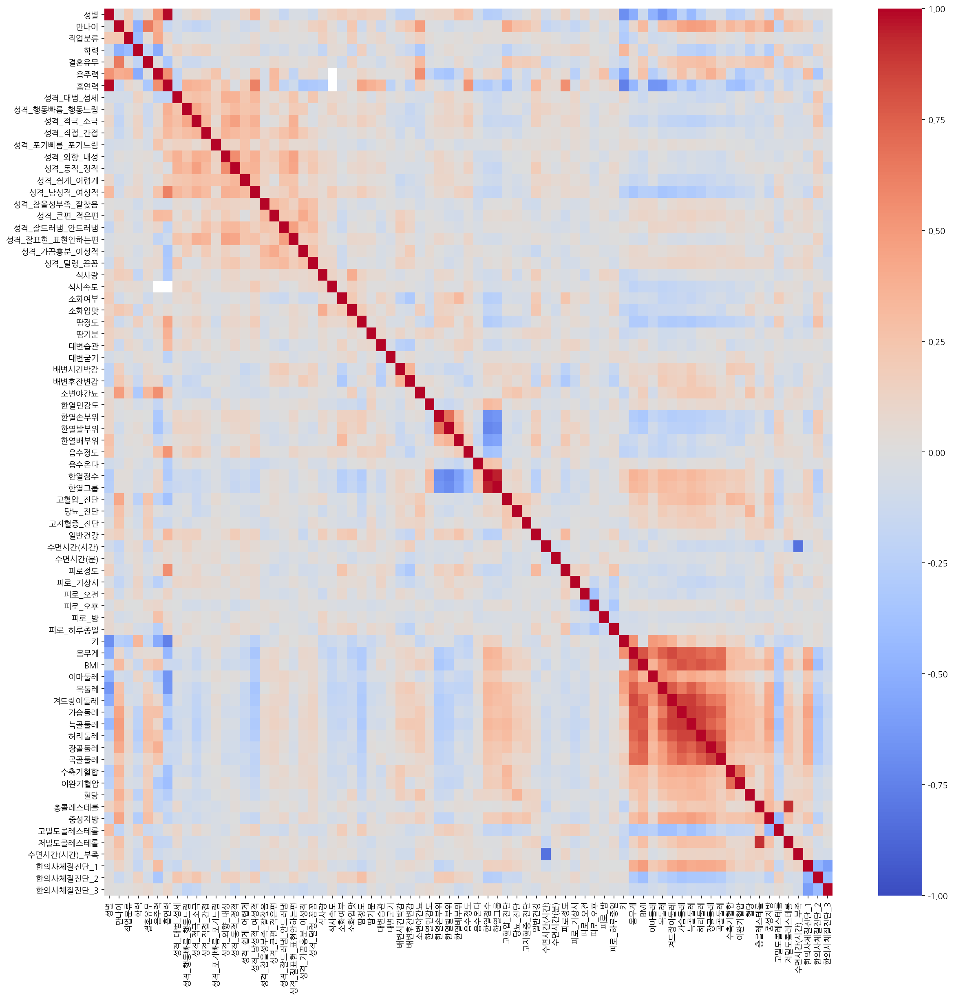

In [ ]:
# heatmap도 그려본다.
plt.figure(figsize=(20,20))
sns.heatmap(df_matrix3_corr_s, vmax=1, vmin=-1, cmap="coolwarm")

In [ ]:
##1 (spearman을 이용한) 태음인의 상관관계 보기.
df_matrix3_corr_s["한의사체질진단_1"].sort_values(ascending=False)

한의사체질진단_1    1.000000
BMI          0.480416
가슴둘레         0.451786
허리둘레         0.421277
장골둘레         0.410828
               ...   
학력          -0.165072
고밀도콜레스테롤    -0.169304
한열손부위       -0.196668
한의사체질진단_2   -0.471405
한의사체질진단_3   -0.599145
Name: 한의사체질진단_1, Length: 75, dtype: float64

In [ ]:
##2 (spearman을 이용한) 소음인의 상관관계 보기.
df_matrix3_corr_s["한의사체질진단_2"].sort_values(ascending=False)

한의사체질진단_2    1.000000
땀정도          0.274306
성격_적극_소극     0.245583
성격_대범_섬세     0.239353
한열발부위        0.204482
               ...   
음주력         -0.331606
가슴둘레        -0.344945
BMI         -0.392509
한의사체질진단_3   -0.423659
한의사체질진단_1   -0.471405
Name: 한의사체질진단_2, Length: 75, dtype: float64

In [ ]:
##3 (spearman을 이용한) 소양인의 상관관계 보기.
df_matrix3_corr_s["한의사체질진단_3"].sort_values(ascending=False)

한의사체질진단_3       1.000000
흡연력             0.106438
한열그룹            0.082526
한열점수            0.082478
결혼유무            0.071225
                  ...   
성격_동적_정적       -0.155175
성격_적극_소극       -0.164372
성격_행동빠름_행동느림   -0.195338
한의사체질진단_2      -0.423659
한의사체질진단_1      -0.599145
Name: 한의사체질진단_3, Length: 75, dtype: float64